![](https://calchamberalert.com/wp-content/uploads/emergency.png "credit : https://calchamberalert.com/2017/10/20/what-employers-should-know-about-emergencies-and-the-workplace")

# Table of Contents

* [1. Introduction](#1)
* [2. Libraries & Configurations](#2)
* [3 Explore Dataset](#3)
  * [3.1 Metadata Summary](#3.1)
  * [3.2 Missing Values](#3.2)
* [4 Data Cleaning](#4)
* [5 Feature Extraction](#5)
  * [5.1 Location](#5.1)
  * [5.2 City](#5.2)
  * [5.3 State](#5.3)
  * [5.4 Time](#5.4)
* [6 EDA](#6)
  * [6.1 Incidents](#6.1)
  * [6.2 Agency](#6.2)
  * [6.3 Description (Codes)](#6.3)
  * [6.4 Duration](#6.4)
  * [6.5 Incident Location](#6.5)
  * [6.6 Incident Date & Time](#6.6)
  * [6.7 Major Incidents](#6.7)
* [7 Clustering](#7)
  * [7.1 Preprocess Dataset](#7.1)
  * [7.2 Agency Engagement Vs Incident Duration by City](#7.2)
* [8 Key Insights](#8)
* [9 Top 10 Incidents](#9)
* [10 Top State : CA](#10)
  * [10.1 Descriptive Analysis](#10.1)
  * [10.2 Geoplot](#10.2)
  * [10.3 Insights](#10.3)
* [11 Conclusions](#11)
* [12 References](#12)

<a id='1'></a>
# 1 Introduction

The objective of this project is to do an extensive analysis of the Pulsepoint Emergency Data as well as apply some clustering and dimensionality reduction techniques.

The result from the analysis might be beneficial to a varieties of business stakeholders. 

For example – 
1. For real estate business agencies, they may make decisions based on emergency occurrences and the frequency of which place is risky for housing and which are not and take precautions properly. 
2. For local authorities to avoid planting oil/gas filling stations fire prone locations. 
3. It will also be helpful for the local government to estimate a proper budget to take preventive measures for local emergencies and other natural phenomena.


## Background

**[PulsePoint](https://www.pulsepoint.org)** is a **911-connected mobile** app that allows users to view and receive alerts on calls being responded to by **fire departments and emergency medical services**. The app's main feature, and where its name comes from, is that it sends alerts to users at the same time that dispatchers are sending the call to emergency crews. The goal is to increase the possibility that a victim in cardiac arrest will receive cardiopulmonary resuscitation (CPR) quickly. The app uses the current location of a user and will alert them if someone in their vicinity is in need of CPR. The app, which interfaces with the local government public safety answering point, will send notifications to users only if the victim is in a public place and only to users that are in the immediate vicinity of the emergency. - [Wikipedia](https://en.wikipedia.org/wiki/PulsePoint)

Pulsepoint logs of the incidents can be used to identify the local pattern of emergencies which is helpful for local businesses as well as emergency agencies to stay alert and take precautions which, in the long term ensure the social well-being of the people.

## Data Collection

The dataset was collected via web scraping using python. The logs were collected from **2021-05-02** to present. I uploaded the dataset on kaggle


PulsePoint Respond Mobile APP UI (visual inspection of the data) : 

<img src="https://user-images.githubusercontent.com/40615350/145330164-98421295-1b06-4b61-bb95-75437415a0d2.png" alt="PulsePoint Mobile APP UI" />

NB: This project also serves as my assignments for the course below -
- [IBM Unsupervised Machine Learning](https://www.coursera.org/learn/ibm-unsupervised-machine-learning?specialization=ibm-machine-learning)

### View this project on GitHub : [ahmedshahriar/PulsePoint-Data-Analytics](https://github.com/ahmedshahriar/PulsePoint-Data-Analytics)

### Kaggle Notebook : [ahmedshahriarsakib/pulsepoint-emergency-analytics](https://www.kaggle.com/ahmedshahriarsakib/pulsepoint-emergency-analytics)

### Kaggle Dataset : [ahmedshahriarsakib/pulsepoint-respond-local-threats-and-emergency](https://www.kaggle.com/ahmedshahriarsakib/pulsepoint-respond-local-threats-and-emergency)

<a id='2'></a>
# 2 Libraries & Configuration

#### I used [positionstack](https://positionstack.com) for geocoding data as a backup option for Nominatim
#### You can create an account on [positionstack API](https://positionstack.com/product)  (25,000 free requests/month)

In [ ]:
%%capture
!pip install geopandas    # geo-plotting     
!pip install pdpipe       # data pipeline 
!pip install yellowbrick  # for elbow method 

In [ ]:
import re
import json
import requests
import urllib

import pandas as pd
import numpy as np
import pdpipe as pdp

# from tqdm import tqdm
from tqdm.auto import tqdm  # for notebooks

# Create new `pandas` methods which use `tqdm` progress
# (can use tqdm_gui, optional kwargs, etc.)
tqdm.pandas() # https://stackoverflow.com/a/34365537/11105356


from datetime import timedelta, datetime

# data visualization

import folium
import plotly.graph_objects as go
import plotly.express as px
import geopandas
import seaborn as sns
import matplotlib.pyplot as plt

from plotly.subplots import make_subplots
from wordcloud import WordCloud

from folium.plugins import MarkerCluster, HeatMap


from geopy.geocoders import Nominatim # reverse geocoding

# data processing and algorithm
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import (KMeans, DBSCAN, OPTICS, 
                             AgglomerativeClustering,
                             MiniBatchKMeans)
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.decomposition import PCA


from IPython.display import Image, HTML, Markdown
# from IPython.html import widgets


%matplotlib inline
sns.set(style='whitegrid', palette='muted', font_scale=1.2)

plt.rcParams['figure.figsize'] = 12, 8

# utility function to print markdown string
def printmd(string):
    display(Markdown(string))

pd.set_option('display.max_colwidth', None)

SEED = 42

# set the size of the geo bubble
def set_size(value):
    '''
    Takes the numeric value of a parameter to visualize on a map (Plotly Geo-Scatter plot)
    Returns a number to indicate the size of a bubble for a country which numeric attribute value 
    was supplied as an input
    '''
    result = np.log(1+value)
    if result < 0:
        result = 0.1
    return result

# API Key
API_KEY_POSITIONSTACK = "YOUR_API_KEY_HERE"

<a id='3'></a>
# 3 Explore Dataset

In [ ]:
parse_dates=['date_of_incident']
pulse_point_df = pd.read_csv("/content/PulsePoint_local_threats_emergencies.csv", 
                             parse_dates=parse_dates,
                             skipinitialspace=True)

# to parse datetime column later
# pulse_point_df.date_of_incident = pd.to_datetime(pulse_point_df.date_of_incident)

In [ ]:
printmd(f"Dataset has **{pulse_point_df.shape[0]}** rows and **{pulse_point_df.shape[1]}** columns")

Dataset has **313322** rows and **11** columns

**Strip Object Columns**

It will remove noise like extra whitespaces. 

Example - there are some state values in the data such as - " CA" and "CA" which can be identified as separate entities. So this operation will remove that issue.

In [ ]:
pulse_point_df = pulse_point_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

In [ ]:
pulse_point_df.sort_values(by='date_of_incident')

,id,type,title,agency,location,timestamp_time,date_of_incident,description,duration,incident_logo,agency_logo
142811,3698,recent,Refuse/Garbage Fire,LAFD - Valley,"6959 N LAURELGROVE AVE, LOS ANGELES, CA",1:15 PM,2021-05-02,E89,31 m,https://web.pulsepoint.org/assets/images/list/gf_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=168
142723,3612,recent,Residential Fire,Santee Fire,"8818 RUMSON DR, SANTEE, CA",12:53 PM,2021-05-02,4103 B2 E205 E4 E5 E9 M5 T4 TIM1,2 h 7 m,https://web.pulsepoint.org/assets/images/list/rf_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=346
142724,3613,recent,Traffic Collision Involving Structure,San Miguel Fire,"560 ELKELTON BLVD, SPRING VALLEY, CA",10:25 AM,2021-05-02,AMR416 B6 E10 E16 E210 E38 MH1 SNDE32 T15,16 m,https://web.pulsepoint.org/assets/images/list/tcs_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=831
142725,3614,recent,Structure Fire,Santa Barbara City,"1434 EUCLID AVE, SANTA BARBARA, CA",7:48 AM,2021-05-02,BC71 E175 E72 E74 FP75 TK171,1 h 11 m,https://web.pulsepoint.org/assets/images/list/sf_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=1336
142726,3615,recent,Extinguished Fire,Santa Cruz County,"24100 SR 9, CASTLE ROCK, CA",5:56 AM,2021-05-02,NCZU2,31 m,https://web.pulsepoint.org/assets/images/list/ef_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=307
...,...,...,...,...,...,...,...,...,...,...,...
140254,314568,recent,Traffic Collision,Mecklenburg EMS,"PROVIDENCE RD WEST & LANCASTER HY, CHARLOTTE, NC",5:23 AM,2021-11-30,M54,44 m,https://web.pulsepoint.org/assets/images/list/tc_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=1156
140255,314569,recent,Gas Leak,Milwaukee Fire,"9726 W BROWN DEER RD, STE 8, MILWAUKEE, WI",5:20 AM,2021-11-30,NaN,16 m,https://web.pulsepoint.org/assets/images/list/gas_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=633
140256,314570,recent,Medical Emergency,Metro Area Ambulance,"N 14TH ST, BISMARCK, ND",5:20 AM,2021-11-30,6255,19 m,https://web.pulsepoint.org/assets/images/list/me_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=945
140258,314572,recent,Traffic Collision,Mecklenburg EMS,"E INDEPENDENCE BLVD, MATTHEWS, NC",5:17 AM,2021-11-30,22 M02 MAT1-F3 MAT1-R3 MAT2-F2,19 m,https://web.pulsepoint.org/assets/images/list/tc_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=1156


Data was collected from **2021-05-02** to present

<a id='3.1'></a>
## 3.1 Metadata Summary

In [ ]:
pulse_point_df.columns

Index(['id', 'type', 'title', 'agency', 'location', 'timestamp_time',
       'date_of_incident', 'description', 'duration', 'incident_logo',
       'agency_logo'],
      dtype='object')

| **Columns**        | **Description**                           | **Data Type**  |
| ------------------ | ----------------------------------------- | -------------- |
| id                 | Contains record id                        | numeric, int   |
| type               | Incident type (recent or active)          | object         |
| title              | Title of the incident (e.g., Medical Emergency, Fire)              | object         |
| agency             | Agency name (e.g., fire departments, emergency medical services)                              | object         |
| location           | Location where the incident took place   | object         |
| timestamp\_time    | Time when the incident record was logged | object         |
| date\_of\_incident | Date when the incident record was logged     | datetime       |
| description        | Emergency code description (e.g., **E53** - refers to **Fire Engine Truck** )       | object         |
| duration           | Duration of the incident                  | object         |
| Incident\_logo     | Logo of the incident                      | object         |
| agency\_logo       | Logo of the agency                        | object         |

In [ ]:
pulse_point_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313322 entries, 0 to 313321
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   id                313322 non-null  int64         
 1   type              313322 non-null  object        
 2   title             313322 non-null  object        
 3   agency            313322 non-null  object        
 4   location          313322 non-null  object        
 5   timestamp_time    313322 non-null  object        
 6   date_of_incident  313322 non-null  datetime64[ns]
 7   description       298541 non-null  object        
 8   duration          243773 non-null  object        
 9   incident_logo     313322 non-null  object        
 10  agency_logo       313322 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(9)
memory usage: 26.3+ MB


### Data Types

In [ ]:
pulse_point_df.dtypes.value_counts()

object            9
datetime64[ns]    1
int64             1
dtype: int64

### Object Data

In [ ]:
pulse_point_df.describe(include='object').T

,count,unique,top,freq
type,313322,2,recent,243773
title,313322,89,Medical Emergency,206869
agency,313322,783,Montgomery County,6387
location,313322,198876,"EUCLID AV, EUCLID, OH",116
timestamp_time,313322,1440,6:41 AM,370
description,298541,100136,E1,1159
duration,243773,694,16 m,5618
incident_logo,313322,89,https://web.pulsepoint.org/assets/images/list/me_list.png,206869
agency_logo,313322,642,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=100,5191


### Web Image Data

In [ ]:
def path_to_image_html(path):
    '''
     This function essentially convert the image url to 
     '<img src="'+ path + '"/>' format. And one can put any
     formatting adjustments to control the height, aspect ratio, size etc.
     within as in the below example. 
    '''

    return '<img src="'+ path + '" style=max-height:124px;"/>' # option : '" width="60" 

pulse_point_df_short = pulse_point_df.head(10)
HTML(pulse_point_df_short.to_html(escape=False , formatters=dict(incident_logo=path_to_image_html, agency_logo=path_to_image_html)))

,id,type,title,agency,location,timestamp_time,date_of_incident,description,duration,incident_logo,agency_logo
0,174293,recent,Medical Emergency,OCFA (Div 2),"EXECUTIVE PK, IRVINE, CA",3:05 AM,2021-09-16,CAR8799 E28,19 m,,
1,174294,recent,Medical Emergency,OCFA (Div 5),"LOS ADORNOS, ALISO VIEJO, CA",3:05 AM,2021-09-16,CAR7199 E222,35 m,,
2,174295,recent,Medical Emergency,Oceanside FD,"DIXON RD, OCEANSIDE, CA",3:00 AM,2021-09-16,E216 RA216,1 h 50 m,,
3,174296,recent,Medical Emergency,OCFA (Div 7),"TULARE ST, BUENA PARK, CA",3:00 AM,2021-09-16,CAR9361 E61,28 m,,
4,174297,recent,Medical Emergency,OCFA (Div 6),"S NEWHOPE ST, SANTA ANA, CA",2:59 AM,2021-09-16,CAR9578 E78,38 m,,
5,174298,recent,Medical Emergency,Olathe Fire,"W 124TH TER, OLATHE, KS",2:58 AM,2021-09-16,M1151 S52,1 h 2 m,,
6,174299,recent,Medical Emergency,OCFA (Div 4),"NEWPORT AVE, TUSTIN, CA",2:57 AM,2021-09-16,CAR6526 E121,31 m,,
7,174300,recent,Medical Emergency,OCFA (Div 5),"GREENLAWN CIR, LAGUNA NIGUEL, CA",2:55 AM,2021-09-16,CAR7599 E39,22 m,,
8,174301,recent,Medical Emergency,OCFA (Div 2),"GIOTTO, IRVINE, CA",2:53 AM,2021-09-16,CAR6547 E6,21 m,,
9,174302,recent,Smoke Detector,OCFA (Div 6),"1801 S GREENVILLE ST, SANTA ANA, CA (VALLEY HIGH SCHOOL)",2:52 AM,2021-09-16,E77,2 m,,


<a id='3.2'></a>
## 3.2 Missing Values

Number of rows with at least 1 missing values: 81564
Number of columns with missing values: 2

Missing percentage (desceding):


,Total,Percentage(%)
duration,69549,22.197292
description,14781,4.717511


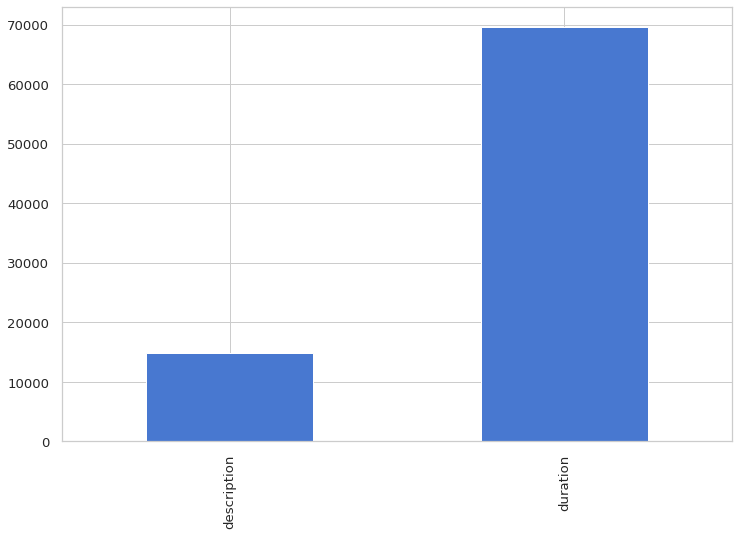

In [ ]:
def missing_value_describe(data):
    # check missing values in the data
    total = data.isna().sum().sort_values(ascending=False)
    missing_value_pct_stats = (data.isnull().sum() / len(data)*100)
    missing_value_col_count = sum(missing_value_pct_stats > 0)

    # missing_value_stats = missing_value_pct_stats.sort_values(ascending=False)[:missing_value_col_count]
    missing_data = pd.concat([total, missing_value_pct_stats], axis=1, keys=['Total', 'Percentage(%)'])

    print("Number of rows with at least 1 missing values:", data.isna().any(axis = 1).sum())
    print("Number of columns with missing values:", missing_value_col_count)

    if missing_value_col_count != 0:
        # print out column names with missing value percentage
        print("\nMissing percentage (desceding):")
        display(missing_data[:missing_value_col_count])

        # plot missing values
        missing = data.isnull().sum()
        missing = missing[missing > 0]
        missing.sort_values(inplace=True)
        missing.plot.bar()
    else:
        print("No missing data!!!")

# pass a dataframe to the function
missing_value_describe(pulse_point_df)

<a id='4'></a>
# 4 Data Cleaning

## Discard Columns

In [ ]:
pulse_point_df.drop(['id', 'incident_logo', 'agency_logo'], axis=1, inplace=True)

## Remove Active Incidents

Because active incidents are the noisy duplicated data of the “**recent type incident**” which was unable to remove during the data collection process. Thus, it does not contribute to the analysis. 

In [ ]:
pulse_point_df.type.value_counts()

recent    243773
active     69549
Name: type, dtype: int64

In [ ]:
pulse_point_df.drop(pulse_point_df[pulse_point_df.type == 'active'].index, inplace=True)
pulse_point_df.reset_index(drop=True, inplace=True)

Drop redundant column **"type"**

In [ ]:
pulse_point_df.drop(columns=['type'], axis=1, inplace=True)

<a id='5'></a>
# 5 Feature Extraction

<a id='5.1'></a>
## 5.1 Location

In [ ]:
pulse_point_df.location

0                           EXECUTIVE PK, IRVINE, CA
1                       LOS ADORNOS, ALISO VIEJO, CA
2                            DIXON RD, OCEANSIDE, CA
3                          TULARE ST, BUENA PARK, CA
4                        S NEWHOPE ST, SANTA ANA, CA
                             ...                    
243768                      COLLEGE BLVD, OLATHE, KS
243769                     E SANTA FE ST, OLATHE, KS
243770    ANTEATER DR & BONITA CANYON DR, IRVINE, CA
243771                     N HORNE ST, OCEANSIDE, CA
243772                   W WARNER AVE, SANTA ANA, CA
Name: location, Length: 243773, dtype: object

In [ ]:
pulse_point_df.location.value_counts().head(10)

COLLINS AVE, MIAMI BEACH, FL                                    89
N HARBOR BL, FULLERTON, CA                                      72
WASHINGTON AVE, MIAMI BEACH, FL                                 69
175 NE 1ST ST, MCMINNVILLE, OR (MCMINNVILLE FIRE DEPARTMENT)    66
FREMONT BLVD, FREMONT, CA                                       65
ALTON RD, MIAMI BEACH, FL                                       61
E STATE ST, ROCKFORD, IL                                        60
PRESTON RD, FRISCO, TX                                          60
LEGACY DR, FRISCO, TX                                           58
E BARNETT RD, MEDFORD, OR                                       57
Name: location, dtype: int64

### Insights and Feature Extraction

There are many variations in the **location** column:

Such as - 
* NE OAK SPRINGS FARM RD, CARLTON, OR
* W 10TH ST, LONG BEACH, CA
* 302 E OJAI AVE, OJAI, CA (OJAI ARCADE (21002302))
* 175 NE 1ST ST, MCMINNVILLE, OR (MCMINNVILLE FIRE DEPARTMENT)
* E BARNETT RD, MEDFORD, OR

We can split the locations into multiple features -  

>### State
Text after the last comma appears to be the short form of US states or Canadian provinces.

**CA** -> California state

**OR** -> Oregon state

>### City
Text after second last comma appears to be city name (or town, county name)

**MEDFORD** is a city in Oregon (last example - "E BARNETT RD, MEDFORD, OR")

>### Address
Apart from state and city name, the rest will be counted as address features if there are three comma-separated elements (texts)

>### Address_2
Apart from state, city, and address the rest will be counted as extended address (**address_2**) feature if there are four comma-separated element/string 

>### Business 
Bracket enclosed string will be counted as **Business Name**. 

From the above example - **OJAI ARCADE (21002302)** and **MCMINNVILLE FIRE DEPARTMENT** are counted as **business feature**

### Business Place Extractor

In [ ]:
def get_business_name(location):
    # https://stackoverflow.com/a/38212061/11105356
    stack = 0
    start_index = None
    results = []

    for i, c in enumerate(location):
        if c == '(':
            if stack == 0:
                start_index = i + 1  # string to extract starts one index later

            # push to stack
            stack += 1
        elif c == ')':
            # pop stack
            stack -= 1

            if stack == 0:
                results.append(location[start_index:i])
    try:
      if len(results) == 0:
        return None
      elif len(results) == 1 and len(results[0]) == 1:
        return None
      elif len(results) == 1 and len(results[0])!=1:
        return results[0].strip()
      elif len(results) > 1 and len(results[0])==1:
        return None
      else:
        return results[1].strip()
    except IndexError as ie:
      pass

### handles variations such as -
# 5709 RICHMOND RD, STE 76, JAMES CITY COUNTY, VA (JANIE & JACK)
# 433 SARATOGA RD, SCHENECTADY, NY ((GLENVILLE)EAST GLENVILLE FD)
# I 229 RAMP  & I 229 RAMP (0.1 MILES), SIOUX FALLS, SD (I 229 MM 8 NB)
# 6501 MISTY WATERS DR, STE (S)E260 (N), BURLEIGH COUNTY, ND

### Split Location

>**Example 1 (3 elements)**: **`302 E OJAI AVE, OJAI, CA (OJAI ARCADE (21002302))`** 
>
> address = **`302 E OJAI AVE`**, city = **`OJAI`**, state = **`CA`**, business = **`OJAI ARCADE (21002302)`**

>**Example 2 (4 elements)**: **`GRASSIE BLVD, STE 212, WINNIPEG, MANITOBA`** 
>
> address = **`GRASSIE BLVD`**, address_2 = **`STE 212`**, city = **`WINNIPEG`**, state = **`MANITOBA`** (wil be converted to `MB` later)

In [ ]:
# examples
# 302 E OJAI AVE, OJAI, CA (OJAI ARCADE (21002302)) --- 3 segments with business inside
# 1959 MORSE RD, COLUMBUS, OH (DOLLAR GENERAL)
# I 229 RAMP  & I 229 RAMP (0.1 MILES), SIOUX FALLS, SD (I 229 MM 8 NB)
# GRASSIE BLVD, STE 212, WINNIPEG, MANITOBA --- 4 segments



# split location into 3 or 4 parts depending on number of commas -> 
# 3 segments : address, city, state
# 4 segments : address, address_2, city, state


# to extract bracket enclosed string 
pulse_point_df['business'] = pulse_point_df.location.apply(lambda x : get_business_name(x))

### remove enclosed business name from the location string
pulse_point_location_data = pulse_point_df.apply(lambda row : row['location'].replace(str(row['business']), ''), axis=1)

# remove leftover bracket from the business replacemnt
# https://stackoverflow.com/a/49183590/11105356
# remove a (...) substring with a leading whitespace at the end of the string only
pulse_point_location_data = pulse_point_location_data.str.replace(r"\s*\([^()]*\)$","").str.strip()


# split the location
four_col_location_split = ['address', 'address_2', 'city','state']
three_col_location_split = ['address', 'city','state']


# four col indices
# pulse_point_location_data[pulse_point_location_data.str.split(',', expand=True)[3].notna()]

extra_loc_data = pulse_point_location_data.str.split(',', expand=True) # to expand columns
four_col_indices = extra_loc_data[extra_loc_data.apply(lambda x: np.all(pd.notnull(x[3])) , axis = 1)].index
four_col_loc_df = extra_loc_data.iloc[four_col_indices]
four_col_loc_df.columns = four_col_location_split
four_col_loc_df

,address,address_2,city,state
59,496 CALLE CADIZ,STE C,LAGUNA WOODS,CA
65,3855 MISSION AVE,BLDG 1086G3,OCEANSIDE,CA
90,570 ELAINE AVE,BLDG 1067A6,OCEANSIDE,CA
94,25 LAKE RD,STE 260,IRVINE,CA
116,1482 MERION WAY,STE 31D,SEAL BEACH,CA
...,...,...,...,...
243494,401 W 1ST ST,STE 217,SANTA ANA,CA
243603,4070 MISSION AVE,BLDG 1086H2,OCEANSIDE,CA
243610,2103 RONDA GRANADA,STE C,LAGUNA WOODS,CA
243672,10 MARQUETTE,STE 135,IRVINE,CA


### Four Features

In [ ]:
pulse_point_df.loc[four_col_loc_df.index , four_col_location_split] = four_col_loc_df
pulse_point_df[four_col_location_split] = pulse_point_df[four_col_location_split].apply(lambda x: x.str.strip())
pulse_point_df[four_col_location_split]

# there are very few numbers of four feature location than three feature location

,address,address_2,city,state
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN
...,...,...,...,...
243768,NaN,NaN,NaN,NaN
243769,NaN,NaN,NaN,NaN
243770,NaN,NaN,NaN,NaN
243771,NaN,NaN,NaN,NaN


### Three Features

In [ ]:
four_col_loc_df_mask = extra_loc_data.index.isin(four_col_indices)
three_col_loc_df = extra_loc_data[~four_col_loc_df_mask].drop([3], axis=1)
three_col_loc_df.columns = three_col_location_split

# extra_loc_data[~three_col_loc_df][3].notna().sum() # to check null values

three_col_loc_df

,address,city,state
0,EXECUTIVE PK,IRVINE,CA
1,LOS ADORNOS,ALISO VIEJO,CA
2,DIXON RD,OCEANSIDE,CA
3,TULARE ST,BUENA PARK,CA
4,S NEWHOPE ST,SANTA ANA,CA
...,...,...,...
243768,COLLEGE BLVD,OLATHE,KS
243769,E SANTA FE ST,OLATHE,KS
243770,ANTEATER DR & BONITA CANYON DR,IRVINE,CA
243771,N HORNE ST,OCEANSIDE,CA


In [ ]:
pulse_point_df.loc[three_col_loc_df.index , three_col_location_split] = three_col_loc_df
pulse_point_df[three_col_location_split] = pulse_point_df[three_col_location_split].apply(lambda x: x.str.strip())
pulse_point_df[three_col_location_split]

,address,city,state
0,EXECUTIVE PK,IRVINE,CA
1,LOS ADORNOS,ALISO VIEJO,CA
2,DIXON RD,OCEANSIDE,CA
3,TULARE ST,BUENA PARK,CA
4,S NEWHOPE ST,SANTA ANA,CA
...,...,...,...
243768,COLLEGE BLVD,OLATHE,KS
243769,E SANTA FE ST,OLATHE,KS
243770,ANTEATER DR & BONITA CANYON DR,IRVINE,CA
243771,N HORNE ST,OCEANSIDE,CA


### Final Merging of Location Features

In [ ]:
pulse_point_df[['location','address', 'address_2', 'city','state', 'business']]

,location,address,address_2,city,state,business
0,"EXECUTIVE PK, IRVINE, CA",EXECUTIVE PK,NaN,IRVINE,CA,None
1,"LOS ADORNOS, ALISO VIEJO, CA",LOS ADORNOS,NaN,ALISO VIEJO,CA,None
2,"DIXON RD, OCEANSIDE, CA",DIXON RD,NaN,OCEANSIDE,CA,None
3,"TULARE ST, BUENA PARK, CA",TULARE ST,NaN,BUENA PARK,CA,None
4,"S NEWHOPE ST, SANTA ANA, CA",S NEWHOPE ST,NaN,SANTA ANA,CA,None
...,...,...,...,...,...,...
243768,"COLLEGE BLVD, OLATHE, KS",COLLEGE BLVD,NaN,OLATHE,KS,None
243769,"E SANTA FE ST, OLATHE, KS",E SANTA FE ST,NaN,OLATHE,KS,None
243770,"ANTEATER DR & BONITA CANYON DR, IRVINE, CA",ANTEATER DR & BONITA CANYON DR,NaN,IRVINE,CA,None
243771,"N HORNE ST, OCEANSIDE, CA",N HORNE ST,NaN,OCEANSIDE,CA,None


Number of rows with at least 1 missing values: 242795
Number of columns with missing values: 2

Missing percentage (desceding):


,Total,Percentage(%)
address_2,235940,96.786765
business,230406,94.516620


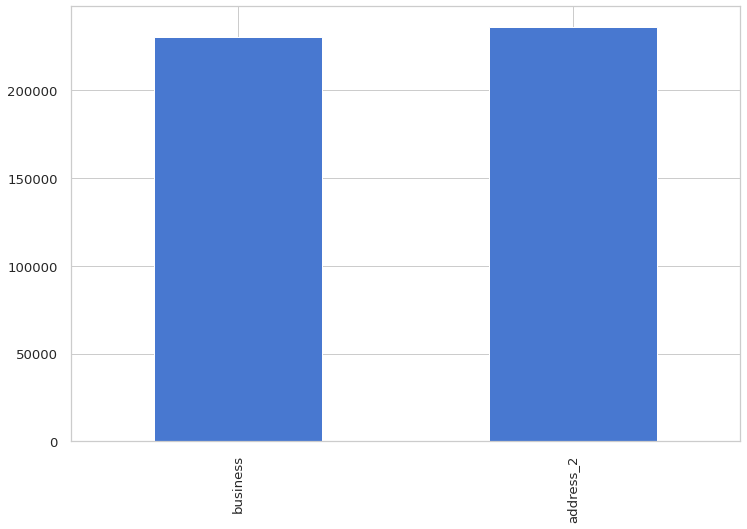

In [ ]:
missing_value_describe(pulse_point_df[['location','address', 'address_2', 'city','state', 'business']])

### Drop Garbage

In [ ]:
pulse_point_df[pulse_point_df.city.isna()]

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state


In [ ]:
pulse_point_df = pulse_point_df[pulse_point_df.city.notna()]

<a id='5.2'></a>
## 5.2 City

In [ ]:
mask = ((pulse_point_df.city.isna()) | (pulse_point_df.city==u'') )

display(pulse_point_df[mask])

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state
150507,Mutual Aid,Sumter Fire & EMS,"34498 CORTEZ BLVD, BLDG NOT FOUND, RIDGE MANOR, FL (RIDGE MANOR)",11:53 PM,2021-07-03,NaN,4 m,RIDGE MANOR,34498 CORTEZ BLVD,BLDG NOT FOUND,,FL
162472,Mutual Aid,San Ramon Valley FPD,"3590 CLAYTON RD, CONCORD, CA (CONCORD)",10:15 PM,2021-07-12,PM32,52 m,CONCORD,3590 CLAYTON RD,NaN,,CA


**The business names are same as the city names**. I first removed the text containing business names and then performed text extraction for cities. That's why city names are blank for the cases like these.  

Let's replace their city names with business names.

In [ ]:
pulse_point_df.loc[mask,'city'] = pulse_point_df[mask].business

<a id='5.3'></a>
## 5.3 State

In [ ]:
display(pulse_point_df.state.value_counts())
printmd(f"**Total {len(pulse_point_df.state.value_counts().index)} States. Some of them are Canadian provinces,  ex - MANITOBA**")

CA                                        70988
FL                                        23213
VA                                        16016
WA                                        15532
OH                                        14440
OR                                        14139
WI                                         8752
MO                                         8361
TX                                         7526
IL                                         5323
PA                                         4594
KS                                         4500
IN                                         4154
NV                                         4106
MN                                         3471
AZ                                         3388
NC                                         3227
TN                                         3098
DE                                         2573
OK                                         2479
MD                                      

**Total 47 States. Some of them are Canadian provinces,  ex - MANITOBA**

### Canadian Province

#### Mapping Canadian provinces to their unique short form


In [ ]:
# Canadian Province Mapping
# https://www150.statcan.gc.ca/n1/pub/92-195-x/2011001/geo/prov/tbl/tbl8-eng.htm
# https://en.wikipedia.org/wiki/Provinces_and_territories_of_Canada

ca_province_dic = {
    'Newfoundland and Labrador': 'NL',
    'Prince Edward Island': 'PE',
    'Nova Scotia': 'NS',
    'New Brunswick': 'NB',
    'Quebec': 'QC',
    'Ontario': 'ON',
    'Manitoba': 'MB',
    'Saskatchewan': 'SK',
    'Alberta': 'AB',
    'British Columbia': 'BC',
    'Yukon': 'YT',
    'Northwest Territories': 'NT',
    'Nunavut': 'NU',
}

# approach 1

# def handle_state(data_attr):
#   for k, v in canada_provinces_dic.items():
#       if data_attr.strip().lower() == k.lower():
#         return canada_provinces_dic[k]
#   else:
#     return data_attr

# pulse_point_df['state'] =  pulse_point_df.state.apply(handle_state)


# approach 2

# https://stackoverflow.com/a/69994272/11105356

ca_province_dict = {k.lower():v for k,v in ca_province_dic.items()}
pulse_point_df['state']  = pulse_point_df['state'].str.lower().map(ca_province_dict).fillna(pulse_point_df.state)

### Noise Removal

In [ ]:
# Exception state : example - 'FL  #1005' , 'NY EAST GLENVILLE FD', ' DE / RM304'

mask = pulse_point_df.state.apply(lambda x:len(x)>2)
display(pulse_point_df[mask].state)

137279    MO (NUSACH HARI BNAI ZION CONGREGATION
162479                                   CONCORD
190210                                    NV ())
Name: state, dtype: object

**Keeping only the first segment which is the short form for city, discarding the rest(noise)**

In [ ]:
pulse_point_df.loc[mask,'state'] = pulse_point_df[mask].state.apply(lambda x: x.split()[0])

In [ ]:
pulse_point_df.state.value_counts()

CA         70988
FL         23213
VA         16016
WA         15532
OH         14440
OR         14139
WI          8752
MO          8362
TX          7526
IL          5323
PA          4594
KS          4500
IN          4154
NV          4107
MN          3471
AZ          3388
NC          3227
TN          3098
DE          2573
OK          2479
MD          2462
MB          2372
ND          2304
NY          1934
DC          1701
CO          1663
NE          1251
SD          1229
ID          1179
NJ          1172
AK          1141
GA          1028
AR           765
SC           763
UT           760
HI           723
KY           693
NM           396
MI           193
IA            98
LA            21
AL            21
ON            15
BC             6
CONCORD        1
Name: state, dtype: int64

### Leftover

In [ ]:
# CONCORD
mask = pulse_point_df.state.str.startswith('CONCORD')

display(pulse_point_df[mask])
printmd("**CONCORD should be in CA**")

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state
162479,Mutual Aid,San Ramon Valley FPD,"2020 GRANT ST, STE 1205, CONCORD",9:51 PM,2021-07-12,PM32,20 m,None,2020 GRANT ST,NaN,STE 1205,CONCORD


**CONCORD should be in CA**

In [ ]:
pulse_point_df.loc[mask,'state'] = 'CA'

In [ ]:
pulse_point_df.state.value_counts()

CA    70989
FL    23213
VA    16016
WA    15532
OH    14440
OR    14139
WI     8752
MO     8362
TX     7526
IL     5323
PA     4594
KS     4500
IN     4154
NV     4107
MN     3471
AZ     3388
NC     3227
TN     3098
DE     2573
OK     2479
MD     2462
MB     2372
ND     2304
NY     1934
DC     1701
CO     1663
NE     1251
SD     1229
ID     1179
NJ     1172
AK     1141
GA     1028
AR      765
SC      763
UT      760
HI      723
KY      693
NM      396
MI      193
IA       98
AL       21
LA       21
ON       15
BC        6
Name: state, dtype: int64

<a id='5.4'></a>
## 5.4  Time

#### Converting time string to seconds

**For example - "1 h 34 m" will be 94*60 = 5640 seconds**

In [ ]:
#https://stackoverflow.com/a/57846984/11105356

UNITS = {'s':'seconds', 'm':'minutes', 'h':'hours', 'd':'days', 'w':'weeks'}

# chance of having days and weeks is none 

def convert_to_seconds(s):
    s = s.replace(" ","")
    return int(timedelta(**{
        UNITS.get(m.group('unit').lower(), 'seconds'): int(m.group('val'))
        for m in re.finditer(r'(?P<val>\d+)(?P<unit>[smhdw]?)', s, flags=re.I)
    }).total_seconds())

# convert_to_seconds("1 h 34 m")

### Duration (seconds)

#### Extract duration total time from “duration” text

In [ ]:
pulse_point_df["duration_in_seconds"] = pulse_point_df.duration.apply(lambda x:convert_to_seconds(x))

### Adding Extra Time Related Features

In [ ]:
pulse_point_df["day_name"], pulse_point_df["weekday"] = pulse_point_df.date_of_incident.dt.day_name(), pulse_point_df.date_of_incident.dt.weekday

pulse_point_df["month_name"] = pulse_point_df.date_of_incident.dt.month_name()


## more features

# pulse_point_df.date_of_incident.dt.month_name()
# pulse_point_df.date_of_incident.dt.month

# pulse_point_df.date_of_incident.dt.day
# pulse_point_df.date_of_incident.dt.day_name()

# pulse_point_df.date_of_incident.dt.weekday
# pulse_point_df.date_of_incident.dt.isocalendar().week

In [ ]:
pulse_point_df.tail(40)

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state,duration_in_seconds,day_name,weekday,month_name
243733,Medical Emergency,OCFA (Div 6),"S DRIFTWOOD DR, SANTA ANA, CA",4:11 AM,2021-09-16,CAR9578 E78 FVYE32,56 m,None,S DRIFTWOOD DR,NaN,SANTA ANA,CA,3360,Thursday,3,September
243734,Medical Emergency,OCFA (Div 3),"CRESTA DEL SOL, SAN CLEMENTE, CA",4:11 AM,2021-09-16,CART50 E50,1 h 23 m,None,CRESTA DEL SOL,NaN,SAN CLEMENTE,CA,4980,Thursday,3,September
243735,Medical Emergency,OCFA (Div 2),"SORRENTO, IRVINE, CA",4:08 AM,2021-09-16,CAR7199 E28,1 h 29 m,None,SORRENTO,NaN,IRVINE,CA,5340,Thursday,3,September
243736,Medical Emergency,Ontario Fire,"N BEVERLY CT, ONTARIO, CA",4:06 AM,2021-09-16,AMB3 ME131 ME134,26 m,None,N BEVERLY CT,NaN,ONTARIO,CA,1560,Thursday,3,September
243737,Traffic Collision,OKC-EMSA,"NW 23RD ST EB, OKLAHOMA CITY, OK",4:05 AM,2021-09-16,384 391,1 h 20 m,None,NW 23RD ST EB,NaN,OKLAHOMA CITY,OK,4800,Thursday,3,September
243738,Medical Emergency,Oceanside FD,"OCEANSIDE BL, OCEANSIDE, CA",4:05 AM,2021-09-16,BLS213 E212 RA217,2 h 21 m,None,OCEANSIDE BL,NaN,OCEANSIDE,CA,8460,Thursday,3,September
243739,Smoke Detector,OCFA (Div 5),"24642 JERONIMO RD, LAKE FOREST, CA (SERRANO JR HIGH SCHOOL)",4:04 AM,2021-09-16,E38,5 m,SERRANO JR HIGH SCHOOL,24642 JERONIMO RD,NaN,LAKE FOREST,CA,300,Thursday,3,September
243740,Medical Emergency,Ontario Fire,"N MOUNTAIN AVE, ONTARIO, CA",4:04 AM,2021-09-16,AMB2 ME134,6 m,None,N MOUNTAIN AVE,NaN,ONTARIO,CA,360,Thursday,3,September
243741,Medical Emergency,OKC-EMSA,"SW 29TH ST, OKLAHOMA CITY, OK",4:03 AM,2021-09-16,NaN,12 m,None,SW 29TH ST,NaN,OKLAHOMA CITY,OK,720,Thursday,3,September
243742,Medical Emergency,Ontario Fire,"E PHILADELPHIA ST, ONTARIO, CA",4:02 AM,2021-09-16,AMB1 ME133,22 m,None,E PHILADELPHIA ST,NaN,ONTARIO,CA,1320,Thursday,3,September


### Time of the day

I will assign **Daytime** values based on the **time range** below - 

| Time of the Day | Range |
| ----------- | ----------- |
| Morning | 5 AM to 11:59 AM|
| Afternoon | 12PM to 4:59 PM |
| Evening | 5 PM to 8:59 PM|
| Night | 9 PM to 11:59 PM |
| Midnight | 12 AM to 4:59 AM|

In [ ]:
# https://stackoverflow.com/a/70018607/11105356

def time_range(time):
  hour = datetime.strptime(time, '%I:%M %p').hour
  if hour > 20:
      return "Night"
  elif hour > 16:
      return "Evening"
  elif hour > 11:
      return "Afternoon"
  elif hour > 4:
      return "Morning"
  else:
      return "Midnight"

In [ ]:
pulse_point_df["time_of_the_day"] = pulse_point_df.timestamp_time.apply(lambda time: time_range(time))

# # pulse_point_df.timestamp_time = pd.to_datetime(pulse_point_df.timestamp_time).dt.time

## Save Cleaned and Processed  Dataset

In [ ]:
pulse_point_df.to_csv('PulsePoint-emergencies-cleaned.csv', index=False)

<a id='6'></a>
# 6 EDA

A quick overview of the preprocessed data- 

The preprocessed dataset contains additional  5 columns extracted from the **location** column, another 5 columns extracted from **date\_of\_incident** and **duration** columns. **Id** , **Incident\_logo** and  **agency\_logo** columns from the original dataset was discarded.

| **Columns**        | **Description**                           | **Data Type**  |
| ------------------ | ----------------------------------------- | -------------- |
| business   | Name of the business place extracted from location(e.g., JANIE & JACK, DOLLAR GENERAL etc.)                      | object|
| address | Address where the incident took place (extracted from location)         | object         |
| address\_2              | Extended address where the incident took place (extracted from location)              | object         |
| city | City where the incident took place (extracted from location). It could also be a town or a country   | object         |
| state    | State where the incident took place (extracted from location) | object         |
| duration\_in\_seconds | Incident duration in seconds (extracted from duration)     | numeric, int|
| day\_name | Name of the day when the incident took place       | object        |
| weekday | The day of the week with Monday=0, Sunday=6.                | object         |
| month_name     | Name of the month (extracted from date)                     | object         |
| time\_of\_the_day  | morning (5AM-11:59AM),  afternoon (12PM-4:59 PM),  evening (5PM-8:59PM),  night (9PM-11:59PM), midnight (12AM-4:59AM)| object |

In [ ]:
printmd(f"There are total **{pulse_point_df.shape[0]}** incidents")

There are total **243773** incidents

In [ ]:
pulse_point_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 243773 entries, 0 to 243772
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   title                243773 non-null  object        
 1   agency               243773 non-null  object        
 2   location             243773 non-null  object        
 3   timestamp_time       243773 non-null  object        
 4   date_of_incident     243773 non-null  datetime64[ns]
 5   description          231758 non-null  object        
 6   duration             243773 non-null  object        
 7   business             13367 non-null   object        
 8   address              243773 non-null  object        
 9   address_2            7833 non-null    object        
 10  city                 243773 non-null  object        
 11  state                243773 non-null  object        
 12  duration_in_seconds  243773 non-null  int64         
 13  day_name      

In [ ]:
pulse_point_df.describe().T

,count,mean,std,min,25%,50%,75%,max
duration_in_seconds,243773.0,2569.644546,2884.524109,0.0,960.0,1860.0,3480.0,116760.0
weekday,243773.0,3.096795,2.018152,0.0,1.0,3.0,5.0,6.0


In [ ]:
pulse_point_df.describe(include='object').T

,count,unique,top,freq
title,243773,87,Medical Emergency,154321
agency,243773,764,Montgomery County,5549
location,243773,160230,"COLLINS AVE, MIAMI BEACH, FL",89
timestamp_time,243773,1440,5:04 AM,293
description,231758,76738,E1,1083
duration,243773,694,16 m,5618
business,13367,10100,UNINC,76
address,243773,139586,MAIN ST,404
address_2,7833,2535,STE BLK,229
city,243773,3440,LOS ANGELES,7449


Number of rows with at least 1 missing values: 242828
Number of columns with missing values: 3

Missing percentage (desceding):


,Total,Percentage(%)
address_2,235940,96.786765
business,230406,94.516620
description,12015,4.928766


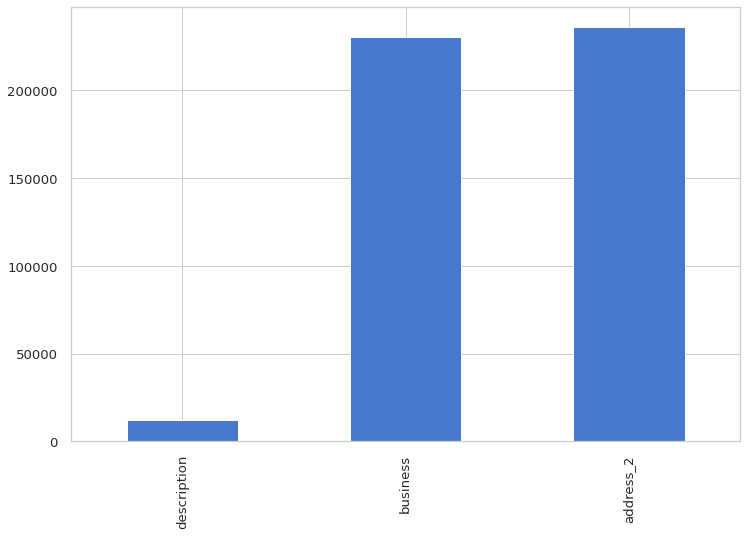

In [ ]:
missing_value_describe(pulse_point_df)

<a id='6.1'></a>
## 6.1 Incidents

In [ ]:
printmd(f"There are total **{len(pulse_point_df.title.unique())}** types of incidents")

There are total **87** types of incidents

### Top 

In [ ]:
pulse_point_df.title.value_counts().head(20)

Medical Emergency             154321
Traffic Collision              19754
Fire Alarm                      9580
Alarm                           6571
Public Service                  6244
Refuse/Garbage Fire             4233
Structure Fire                  3900
Mutual Aid                      2728
Lift Assist                     2700
Fire                            2587
Residential Fire                2392
Expanded Traffic Collision      2184
Interfacility Transfer          1778
Outside Fire                    1726
Vehicle Fire                    1611
Investigation                   1352
Commercial Fire                 1342
Vegetation Fire                 1298
Hazardous Condition             1271
Carbon Monoxide                 1254
Name: title, dtype: int64

### Wordcloud

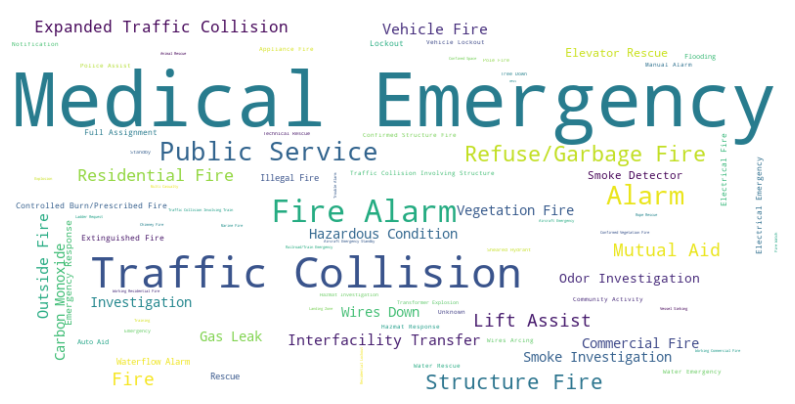

In [ ]:
# crisp wordcloud : https://stackoverflow.com/a/28795577/11105356

data = pulse_point_df.title.value_counts().to_dict()
wc = WordCloud(width=800, height=400,background_color="white", max_font_size=300).generate_from_frequencies(data)
plt.figure(figsize=(14,10))
plt.imshow(wc, interpolation="bilinear")
plt.axis('off')
plt.show()

<a id='6.2'></a>
## 6.2 Agency

In [ ]:
printmd(f"There are total **{len(pulse_point_df.agency.unique())}** agencies")

There are total **764** agencies

### Most Active 

In [ ]:
# Top agencies by incident engagement count

pulse_point_df.agency.value_counts().head(20)

Montgomery County       5549
Milwaukee Fire          4382
Columbus Fire           4202
Contra Costa FPD        4145
Cleveland EMS           4001
Fairfax County Fire     3173
Eug Spfld Fire          2950
Hamilton County         2944
LAFD - Central          2858
Rockford Fire           2817
Boone County Joint      2572
Seminole County Fire    2527
Miami Beach Fire        2492
Seattle FD              2482
Richmond FD & RAA       2425
LAFD - South            2402
WPG Fire Paramedic      2372
Johnson County          2353
Fremont FD              2281
LA County FD (Div 8)    2231
Name: agency, dtype: int64

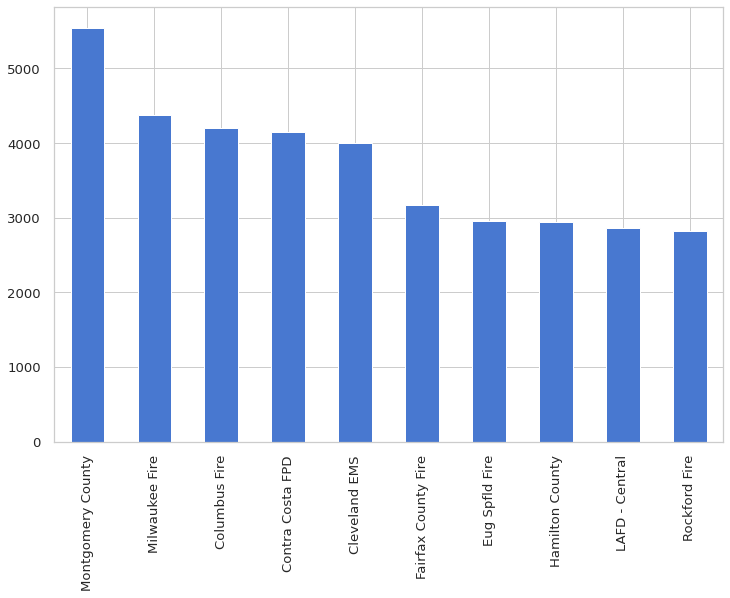

In [ ]:
pulse_point_df.agency.value_counts().head(10).sort_values(ascending=False).plot(kind = 'bar');

### Wordcloud

Most frequent - **Montgomery County**

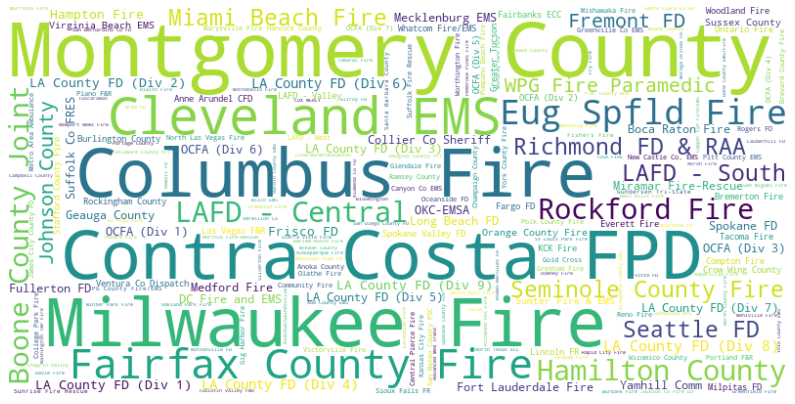

In [ ]:
data = pulse_point_df.agency.value_counts().to_dict()
wc = WordCloud(width=800, height=400,background_color="white", max_font_size=300).generate_from_frequencies(data)
plt.figure(figsize=(14,10))
plt.imshow(wc, interpolation="bilinear")
plt.axis('off')
plt.show()

<a id='6.3'></a>
## 6.3 Description (Codes)

The codes themselves are defined by each agency, and are typically followed by a number to identify a particular instance of each asset type. A legend is sometimes provided on the agency information page, and following are some common examples:

* B=Battalion 
* BC=Battalion 
* Chief E=Engine 
* CMD=Command 
* CPT=Helicopter 
* C=Crew 
* DZR=Dozer 
* HM=Hazmat 
* ME=Medic Engine 
* MRE=Medic Rescue Engine 
* P=Patrol 
* R=Rescue 
* RE=Rescue Engine 
* SQ=Squad 
* T=Truck 
* U=Utility 
* WT=Water Tender 

Credit: [PulsePoint Wikipedia](https://en.wikipedia.org/wiki/PulsePoint#Incident_Responder_Unit_Codes)

*Note: There is no standard for the identifier abbreviations (E, T, S, BC, RA, PM, etc.), and they can vary significantly from agency to agency.*

Example - [Ventura County Fire Department PulsePoint  Unit  Abbreviations PDF](https://vcfd.org/wp-content/uploads/2020/07/PulsePoint_Unit_Abbreviations.pdf)

To know more, visit - [https://www.pulsepoint.org/unit-status-legend](https://www.pulsepoint.org/unit-status-legend)

In [ ]:
pulse_point_df.description.value_counts().head(10)

E1     1083
E2      923
E4      632
E6      597
E11     595
E3      587
M1      549
E10     537
E14     513
E51     492
Name: description, dtype: int64

Checking for **`MRE`(Medic Rescue Engine)** code in description

In [ ]:
mask = pulse_point_df.description.str.contains('MRE', regex=False, na=False)
display(pulse_point_df.description[mask])
printmd(f"**{pulse_point_df.description[mask].count()}** instances contain **MRE** code")

2441                                                      E3 E8 M6 M8 MRED TAC6
18475                                                   ME37 MED442 MRE132 SQ30
18507                                                        ME37 MED442 MRE132
18577                                                              MED503 MRE23
18594                                                             MED442 MRE132
                                          ...                                  
221240                                                             MED501 MRE23
221244                                                             MED442 MRE31
221245                                                                E37 MRE31
221273                                                             MED441 MRE31
221278    B11 B21 B25 B61 E41 E42 E45 E46 ME34 ME40 ME43 ME47 MRE31 Q44 T35 T41
Name: description, Length: 90, dtype: object

**90** instances contain **MRE** code

<a id='6.4'></a>
## 6.4 Duration

In [ ]:
(pulse_point_df.duration_in_seconds/ 60).value_counts().head(30)

# alternative
# pulse_point_df.duration.value_counts().head(20)

16.0    5618
15.0    5569
17.0    5508
18.0    5494
14.0    5406
19.0    5328
20.0    5177
13.0    5169
21.0    5083
12.0    5008
22.0    4770
11.0    4675
10.0    4452
23.0    4439
24.0    4251
9.0     4032
25.0    3913
26.0    3737
27.0    3430
8.0     3382
28.0    3158
29.0    3046
7.0     3000
30.0    2965
31.0    2748
4.0     2660
32.0    2624
5.0     2612
3.0     2531
6.0     2528
Name: duration_in_seconds, dtype: int64

**Most of the emergency engagement lasted under 30 mins**

<a id='6.5'></a>
## 6.5 Incident Location

### City

In [ ]:
printmd(f"There are total **{len(pulse_point_df.city.unique())}** cities PulsePoint covered")

There are total **3440** cities PulsePoint covered

In [ ]:
pulse_point_city_df = pulse_point_df.groupby(['city','state'], as_index=False).count()[['city', 'state', 'title']].reset_index(drop=True).rename(columns={'title':'count'})
pulse_point_city_df.head(50)

,city,state,count
0,*,NM,3
1,**UNDEFINED,CA,17
2,-105.124526,CO,1
3,0304,NJ,4
4,0306,NJ,4
5,0310,NJ,2
6,0311,NJ,2
7,0312,NJ,3
8,0313,NJ,2
9,0315,NJ,1


**Some cities in different states have the same name**

In [ ]:
pulse_point_city_df[pulse_point_city_df.city.str.lower() == 'bloomington']

,city,state,count
319,BLOOMINGTON,CA,9
320,BLOOMINGTON,IN,349


Outliers in city names - **`*`** , **'0324'**, **' **UNDEFINED'**, **'12809 - NAME?'** etc.

In [ ]:
pulse_point_df[pulse_point_df.city.str.startswith('0324')].head()

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state,duration_in_seconds,day_name,weekday,month_name,time_of_the_day
43354,Medical Emergency,Burlington County,"CHURCH RD, 0324, NJ",4:55 AM,2021-10-21,E3671 E3672 P36122,1 h 26 m,None,CHURCH RD,NaN,0324,NJ,5160,Thursday,3,October,Midnight
61438,Fire Alarm,Burlington County,"4105 ADELAIDE DR, 0324, NJ",3:20 AM,2021-11-04,F3614,12 m,None,4105 ADELAIDE DR,NaN,0324,NJ,720,Thursday,3,November,Midnight
61513,Medical Emergency,Burlington County,"NORMANDY DR, 0324, NJ",11:06 PM,2021-11-03,E159 E1591 E3671 P36140,1 h 18 m,None,NORMANDY DR,NaN,0324,NJ,4680,Wednesday,2,November,Night
73522,Medical Emergency,Burlington County,"CHURCH RD, 0324, NJ",7:47 AM,2021-11-10,E1595 E159A E3682 P36122,1 h 2 m,None,CHURCH RD,NaN,0324,NJ,3720,Wednesday,2,November,Morning
73536,Investigation,Burlington County,"FEDERAL ST & OREGON AV, 0324, NJ",7:28 AM,2021-11-10,F362 F3624 P36122,27 m,None,FEDERAL ST & OREGON AV,NaN,0324,NJ,1620,Wednesday,2,November,Morning


#### Geolocation

##### Extract geolocation from the city address

In [ ]:
geolocator = Nominatim(user_agent='myapplication')
location = geolocator.geocode("50TH ST S")
print(location.address)
display(location.raw)
print("Lattitude: ", location.raw['lat'],", Longitude: ", location.raw['lon'])

50th Street South, Gulfport, Pinellas County, Florida, 33707, United States


{'boundingbox': ['27.750967', '27.7517259', '-82.7011036', '-82.701095'],
 'class': 'highway',
 'display_name': '50th Street South, Gulfport, Pinellas County, Florida, 33707, United States',
 'importance': 0.4,
 'lat': '27.7517259',
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright',
 'lon': '-82.7011036',
 'osm_id': 11238610,
 'osm_type': 'way',
 'place_id': 99532491,
 'type': 'residential'}

Lattitude:  27.7517259 , Longitude:  -82.7011036


##### Utility Function

In [ ]:
geolocator = Nominatim(user_agent='myapplication')



def get_nominatim_geocode(address):
    try:
      location = geolocator.geocode(address)
      return location.raw['lon'], location.raw['lat']
    except Exception as e:
        # print(e)
        return None, None
        
# alternative way : scraping from the website 

# def get_nominatim_geocode(address):
#     url = 'https://nominatim.openstreetmap.org/search/' + urllib.parse.quote(address) + '?format=json'
#     try:
#         response = requests.get(url).json()
#         return response[0]["lon"], response[0]["lat"]
#     except Exception as e:
#         # print(e)
#         return None, None

def get_positionstack_geocode(address):
  BASE_URL = "http://api.positionstack.com/v1/forward?access_key="
  API_KEY = API_KEY_POSITIONSTACK
  
  url = BASE_URL +API_KEY+'&query='+urllib.parse.quote(address)
  try:
      response = requests.get(url).json()
      # print( response["data"][0])
      return response["data"][0]["longitude"], response["data"][0]["latitude"]
  except Exception as e:
      # print(e)
      return None, None

def get_geocode(address):
  long,lat = get_nominatim_geocode(address)
  if long == None:
    return get_positionstack_geocode(address)
  else:
    return long,lat

address = "50TH ST S"

get_geocode(address)

('-82.7011036', '27.7517259')

**Some cities with the same names appear in two different countries**. 

examples - 

* NAPLES - Italy 
* Columbia - Country in South America
* Suffolk - UK
* STAFFORD - UK
* NORFOLK - UK

In [ ]:
address = 'Suffolk'
location = geolocator.geocode(address)
location

Location(Suffolk, East of England, England, United Kingdom, (52.241001350000005, 1.0466830312565236, 0.0))

**Adding tailing 'USA' to the location text would solve this issue**

In [ ]:
address = 'Suffolk, USA'
location = geolocator.geocode(address)
location

Location(Suffolk, Suffolk (city), Virginia, 23434, United States, (36.7282096, -76.5835703, 0.0))

**Adding city and country names will help to get the appropriate location**

Let's fetch geolocation of some cities

In [ ]:
test_df = pulse_point_city_df.tail()
test_df

,city,state,count
3678,ZEPHYR COVE,NV,15
3679,ZEPHYRHILLS,FL,12
3680,ZIONSVILLE,IN,163
3681,ZOAR,OH,2
3682,ZOC-ORLANDO,FL,2


In [ ]:
test_df['location'] = test_df['city'] + ', ' + test_df['state'] + ', USA'

# test_df[['city', 'state']].agg(', '.join, axis=1) + ', USA'
test_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,city,state,count,location
3678,ZEPHYR COVE,NV,15,"ZEPHYR COVE, NV, USA"
3679,ZEPHYRHILLS,FL,12,"ZEPHYRHILLS, FL, USA"
3680,ZIONSVILLE,IN,163,"ZIONSVILLE, IN, USA"
3681,ZOAR,OH,2,"ZOAR, OH, USA"
3682,ZOC-ORLANDO,FL,2,"ZOC-ORLANDO, FL, USA"


In [ ]:
%%time
location_test_df = test_df.location.progress_apply(lambda x:get_geocode(str(x.strip()))).apply(pd.Series)

  0%|          | 0/5 [00:00<?, ?it/s]

CPU times: user 102 ms, sys: 12.2 ms, total: 114 ms
Wall time: 2.63 s


In [ ]:
location_test_df.columns = ['longitude', 'latitude']
test_df = test_df.join(location_test_df)
display(test_df)

,city,state,count,location,longitude,latitude
3678,ZEPHYR COVE,NV,15,"ZEPHYR COVE, NV, USA",-119.9472389,39.0060103
3679,ZEPHYRHILLS,FL,12,"ZEPHYRHILLS, FL, USA",-82.1812531782471,28.24262955
3680,ZIONSVILLE,IN,163,"ZIONSVILLE, IN, USA",-86.2616968,39.950724
3681,ZOAR,OH,2,"ZOAR, OH, USA",-81.4223375,40.6142286
3682,ZOC-ORLANDO,FL,2,"ZOC-ORLANDO, FL, USA",-81.2937,28.4196


**Alternative Approach (iterate every rows)**

In [ ]:
%%time
for index,row in test_df.iterrows():
  test_df.loc[index,'longitude'], test_df.loc[index,'latitude'] = get_geocode(row.city.strip())
display(test_df)

,city,state,count,location,longitude,latitude
3678,ZEPHYR COVE,NV,15,"ZEPHYR COVE, NV, USA",-119.9472389,39.0060103
3679,ZEPHYRHILLS,FL,12,"ZEPHYRHILLS, FL, USA",-82.1812531782471,28.24262955
3680,ZIONSVILLE,IN,163,"ZIONSVILLE, IN, USA",-86.2616968,39.950724
3681,ZOAR,OH,2,"ZOAR, OH, USA",-81.4223375,40.6142286
3682,ZOC-ORLANDO,FL,2,"ZOC-ORLANDO, FL, USA",17.2179,48.8399


CPU times: user 59.4 ms, sys: 4.05 ms, total: 63.4 ms
Wall time: 2.46 s


**Create a temporary column "location" by merging city, state and country**

In [ ]:
canada_mask = pulse_point_city_df.state.isin([*ca_province_dic.values()])

pulse_point_city_df['location'] = pulse_point_city_df['city'] + ', ' + pulse_point_city_df['state'] 

pulse_point_city_df['location'].loc[canada_mask] = pulse_point_city_df['location'] + ', CANADA'

pulse_point_city_df['location'].loc[~canada_mask] = pulse_point_city_df['location'] + ', USA'

# to verify

# pulse_point_city_df[pulse_point_city_df['location'].str.endswith('USA')]
# pulse_point_city_df[pulse_point_city_df['location'].str.endswith('CANADA')]

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### Fetch Geolocation

In [ ]:
%%time
location_df = pulse_point_city_df.location.progress_apply(lambda x:get_geocode(str(x.strip()))).apply(pd.Series)

  0%|          | 0/3683 [00:00<?, ?it/s]

CPU times: user 27.9 s, sys: 3.99 s, total: 31.9 s
Wall time: 31min 27s


In [ ]:
location_df.columns = ['longitude', 'latitude']
pulse_point_city_df = pulse_point_city_df.join(location_df)

**Check for missing values and drop cities without geocode**

In [ ]:
pulse_point_city_df.isna().sum()

city         0
state        0
count        0
location     0
longitude    2
latitude     2
dtype: int64

In [ ]:
pulse_point_city_df.dropna(inplace=True)

In [ ]:
pulse_point_city_df.to_csv('City-coordinate.csv', index=False)

In [ ]:
pulse_point_city_df.tail()

,city,state,count,location,longitude,latitude
3678,ZEPHYR COVE,NV,15,"ZEPHYR COVE, NV, USA",-119.9472389,39.0060103
3679,ZEPHYRHILLS,FL,12,"ZEPHYRHILLS, FL, USA",-82.1812531782471,28.24262955
3680,ZIONSVILLE,IN,163,"ZIONSVILLE, IN, USA",-86.2616968,39.950724
3681,ZOAR,OH,2,"ZOAR, OH, USA",-81.4223375,40.6142286
3682,ZOC-ORLANDO,FL,2,"ZOC-ORLANDO, FL, USA",-81.2937,28.4196


#### Top Engagement

In [ ]:
pulse_point_city_df.sort_values(by='count', ascending=False).head(20)

,city,state,count,location,longitude,latitude
1837,LOS ANGELES,CA,7449,"LOS ANGELES, CA, USA",-118.242766,34.0536909
2071,MILWAUKEE,WI,4404,"MILWAUKEE, WI, USA",-87.922497,43.0349931
668,COLUMBUS,OH,4115,"COLUMBUS, OH, USA",-83.0007065,39.9622601
621,CLEVELAND,OH,3977,"CLEVELAND, OH, USA",-81.6934446,41.5051613
2763,ROCKFORD,IL,2950,"ROCKFORD, IL, USA",-89.093966,42.2713945
3075,SPOKANE,WA,2508,"SPOKANE, WA, USA",-117.4235106,47.6571934
2030,MIAMI BEACH,FL,2489,"MIAMI BEACH, FL, USA",-80.1353006,25.7929198
2933,SEATTLE,WA,2481,"SEATTLE, WA, USA",-122.3300624,47.6038321
2711,RICHMOND,VA,2419,"RICHMOND, VA, USA",-77.43428,37.5385087
3624,WINNIPEG,MB,2372,"WINNIPEG, MB, CANADA",-97.1384584,49.8955367


**Top 5 Cities by agency engagement -** 

| **Name**     | **Count** | **State**  |
| ------------ | ---------| -------------- |
| 1. LOS ANGELES   | 7449 | CA   |
| 2. MILWAUKEE   | 4404 | WI   |
| 3. COLUMBUS   | 4115 | OH   |
| 4. CLEVELAND   | 3977 | OH   |
| 5. ROCKFORD   | 2950 | IL   |

#### Heat Map

In [ ]:
geometry = geopandas.points_from_xy(pulse_point_city_df.longitude, pulse_point_city_df.latitude)
geo_df = geopandas.GeoDataFrame(pulse_point_city_df[['city','count','longitude', 'latitude']], geometry=geometry)

geo_df.head()

,city,count,longitude,latitude,geometry
0,*,3,100.54536963597755,13.73723285,POINT (100.54537 13.73723)
1,**UNDEFINED,17,-115.49828405,32.67879935,POINT (-115.49828 32.67880)
2,-105.124526,1,-105.548,38.9967,POINT (-105.54782 38.99666)
3,0304,4,-74.6185170609449,40.36201695,POINT (-74.61852 40.36202)
4,0306,4,-74.6185170609449,40.36201695,POINT (-74.61852 40.36202)


In [ ]:
map = folium.Map(location = [48, -102], tiles='Cartodb dark_matter', zoom_start = 4)

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry ]

# heat_data
HeatMap(heat_data).add_to(map)

map

#### Map Circle Overlays 

In [ ]:
# to avoid recursion depth issue change latitude,longitude type to float
# https://github.com/python-visualization/folium/issues/1105

pulse_point_city_df['latitude'] = pulse_point_city_df['latitude'].astype(float)
pulse_point_city_df['longitude'] = pulse_point_city_df['longitude'].astype(float)

In [ ]:
map_USA = folium.Map(location=[48, -102], 
                     zoom_start=4, 
                     prefer_canvas=True,
                     )


occurences = folium.map.FeatureGroup()
n_mean = pulse_point_city_df['count'].mean()

for lat, lng, number, city in zip(pulse_point_city_df['latitude'],
                                        pulse_point_city_df['longitude'],
                                        pulse_point_city_df['count'],
                                        pulse_point_city_df['city']):
  occurences.add_child(
      folium.vector_layers.CircleMarker(
          [lat, lng],
          radius=number/(n_mean/3), # radius for number of occurrences
          color='yellow',
          fill=True,
          fill_color='blue',
          fill_opacity=0.4,
          # tooltip = city
          tooltip=str(number)+','+str(city)[:21], # can be displayed max 21 character 
          # most of the city names contain 5-20 characters 
          # check pulse_point_city_df.city.apply(len).plot();
          # get more from tooltip https://github.com/python-visualization/folium/issues/1010#issuecomment-435968337
      )
  )

map_USA.add_child(occurences)

### State

In [ ]:
printmd(f"There are total **{len(pulse_point_df.state.unique())}** US states & Canadian provinces PulsePoint covered")

There are total **44** US states & Canadian provinces PulsePoint covered

#### Top Engagement

In [ ]:
pulse_point_df.state.value_counts().head(20)

CA    70989
FL    23213
VA    16016
WA    15532
OH    14440
OR    14139
WI     8752
MO     8362
TX     7526
IL     5323
PA     4594
KS     4500
IN     4154
NV     4107
MN     3471
AZ     3388
NC     3227
TN     3098
DE     2573
OK     2479
Name: state, dtype: int64

**Top 5 States by agency engagement -** 

| **Name**     | **Count** | **Abbreviation**  |
| ------------ | ---------| -------------- |
| 1. California   | 70989 | CA   |
| 2. Florida   | 23213 | FL   |
| 3. Virginia   | 16016 | VA   |
| 4. Washington   | 15532 | WA   |
| 5. Ohio   | 14440 | OH   |

**Let's Visualize it**

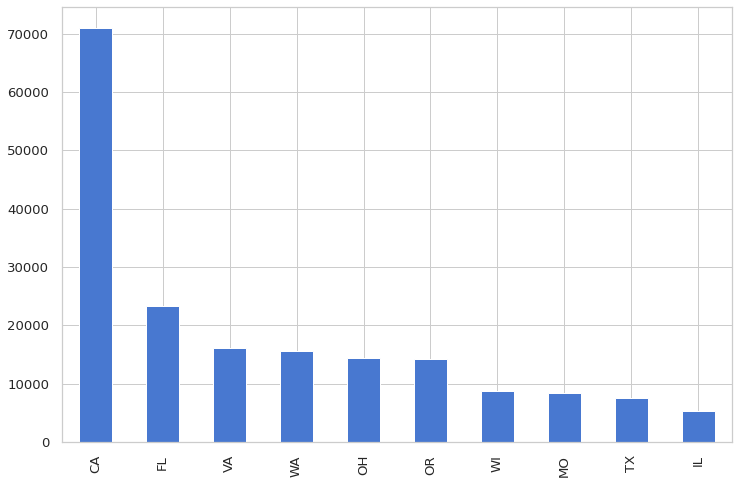

In [ ]:
pulse_point_df.state.value_counts().head(10).sort_values(ascending=False).plot(kind = 'bar');

#### Duration

In [ ]:
(pulse_point_df.groupby('state').sum()['duration_in_seconds'].sort_values(ascending=False) / 3600).head(5)

state
CA    43814.700000
FL    15330.083333
VA    12249.233333
WA    11503.450000
OH    11189.450000
Name: duration_in_seconds, dtype: float64

**California has over 43,000 hours of agency engagement whereas the second highest Florida has over 15,000 hours of engagement which is 3 times less**

### Occurrence Timeline

In [ ]:
df_state_incident = pulse_point_df.groupby(["date_of_incident", 
                                      "state"],
                                     as_index=False).count()[['date_of_incident', 
                                     'state', 'title']].reset_index(drop=True).rename(columns={'date_of_incident':'date',
                                                                                               'title':'count'})

df_state_incident.columns = ['date', 'state', 'count']
df_state_incident

,date,state,count
0,2021-05-02,AK,1
1,2021-05-02,AZ,2
2,2021-05-02,CA,131
3,2021-05-02,CO,4
4,2021-05-02,DC,1
...,...,...,...
4844,2021-11-30,TX,189
4845,2021-11-30,UT,13
4846,2021-11-30,VA,25
4847,2021-11-30,WA,122


In [ ]:
pipeline = pdp.PdPipeline([
    pdp.ApplyByCols('count', set_size, 'size', drop=False),
])

agg_incident_data = pipeline.apply(df_state_incident)

agg_incident_data.fillna(0, inplace=True)
agg_incident_data = agg_incident_data.sort_values(by='date', ascending=True)
agg_incident_data.date = agg_incident_data.date.dt.strftime('%Y-%m-%d') # convert  to string object
agg_incident_data.tail()

,date,state,count,size
4826,2021-11-30,BC,3,1.386294
4825,2021-11-30,AZ,10,2.397895
4847,2021-11-30,WA,122,4.812184
4835,2021-11-30,MN,9,2.302585
4848,2021-11-30,WI,85,4.454347


#### Animated geo scatter plot

In [ ]:
fig = px.scatter_geo(
    agg_incident_data, locations="state", locationmode='USA-states',
    scope="usa",
    color="count", 
    size='size', hover_name="state", 
    range_color= [0, 2000], 
    projection="albers usa", animation_frame="date", 
    title='PulsePoint Incidents: Local Emergencies By State', 
    color_continuous_scale="portland"
    )

fig.show()

### US States Geolocation

#### Scrape States data

In [ ]:
# https://developers.google.com/public-data/docs/canonical/states_csv

state_coordinate = pd.read_html("https://developers.google.com/public-data/docs/canonical/states_csv")[0]
state_coordinate

,state,latitude,longitude,name
0,AK,63.588753,-154.493062,Alaska
1,AL,32.318231,-86.902298,Alabama
2,AR,35.201050,-91.831833,Arkansas
3,AZ,34.048928,-111.093731,Arizona
4,CA,36.778261,-119.417932,California
5,CO,39.550051,-105.782067,Colorado
6,CT,41.603221,-73.087749,Connecticut
7,DC,38.905985,-77.033418,District of Columbia
8,DE,38.910832,-75.527670,Delaware
9,FL,27.664827,-81.515754,Florida


#### US States with Total Incident Count

In [ ]:
pulse_point_state_df = pulse_point_df.groupby(['state']).count()[['title']].reset_index().rename(columns={'title':'count'})
pulse_point_state_df

,state,count
0,AK,1141
1,AL,21
2,AR,765
3,AZ,3388
4,BC,6
5,CA,70989
6,CO,1663
7,DC,1701
8,DE,2573
9,FL,23213


#### Missing US States

In [ ]:
state_coordinate[~state_coordinate.state.isin(pulse_point_state_df.state)].reset_index(drop=True)

,state,latitude,longitude,name
0,CT,41.603221,-73.087749,Connecticut
1,MA,42.407211,-71.382437,Massachusetts
2,ME,45.253783,-69.445469,Maine
3,MS,32.354668,-89.398528,Mississippi
4,MT,46.879682,-110.362566,Montana
5,NH,43.193852,-71.572395,New Hampshire
6,PR,18.220833,-66.590149,Puerto Rico
7,RI,41.580095,-71.477429,Rhode Island
8,VT,44.558803,-72.577841,Vermont
9,WV,38.597626,-80.454903,West Virginia


#### Filter US States

In [ ]:
pulse_point_state_df = pulse_point_state_df.merge(state_coordinate, on='state', how='left')
pulse_point_state_df

# there are three provinces of canada : 
# Manitoba : MB
# British Columbia : BC
# Ontario : ON

,state,count,latitude,longitude,name
0,AK,1141,63.588753,-154.493062,Alaska
1,AL,21,32.318231,-86.902298,Alabama
2,AR,765,35.201050,-91.831833,Arkansas
3,AZ,3388,34.048928,-111.093731,Arizona
4,BC,6,NaN,NaN,NaN
5,CA,70989,36.778261,-119.417932,California
6,CO,1663,39.550051,-105.782067,Colorado
7,DC,1701,38.905985,-77.033418,District of Columbia
8,DE,2573,38.910832,-75.527670,Delaware
9,FL,23213,27.664827,-81.515754,Florida


**Drop Canadian Provinces**

In [ ]:
pulse_point_state_df.dropna(inplace=True)
pulse_point_state_df = pulse_point_state_df.reset_index(drop=True)

### Choropleth USA

In [ ]:
url = (
    "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data"
)

state_geo = f"{url}/us-states.json"
state_data = pulse_point_state_df.iloc[:,[0,1]]

m = folium.Map(location=[48, -102], zoom_start=4)

folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=state_data,
    columns=["state", "count"],
    key_on="feature.id",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Number of Incidents",
).add_to(m)

folium.LayerControl().add_to(m)

m

#### With Count Marker

In [ ]:
# icon credit : https://icon-icons.com/icon/location-sos-phone-call-help/68848
# https://www.clipartmax.com/middle/m2H7i8G6N4H7b1N4_metallic-icon-royalty-free-cliparts-icone-sos-png/

# custom icon : https://stackoverflow.com/a/68992396/11105356

for i in range(0, len(pulse_point_state_df)):
  folium.Marker(
    location = [pulse_point_state_df.iloc[i]['latitude'], pulse_point_state_df.iloc[i]['longitude']],
    popup = folium.Popup(f"{pulse_point_state_df.iloc[i]['name']}\n{pulse_point_state_df.iloc[i]['count']}", parse_html=True),
    icon=folium.features.CustomIcon('https://i.postimg.cc/JhmnMQXj/sos.png', icon_size=(24, 31))
  ).add_to(m)
m

### Choropleth USA Zoomed-IN

In [ ]:
# https://plotly.com/python/choropleth-maps

fig = go.Figure(data=go.Choropleth(
    locations=pulse_point_state_df['state'], # Spatial coordinates
    z = pulse_point_state_df['count'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Total Occurrences",
))

fig.update_layout(
    title_text = 'US PulsePoint Emergencies Occurrences by State',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

<a id='6.6'></a>
## 6.6 Incident Date & Time

### Date

#### Highest Number of Incidents

In [ ]:
pulse_point_df.date_of_incident.value_counts().head(20)

2021-11-13    3918
2021-11-27    3765
2021-11-21    3481
2021-11-07    3164
2021-11-25    2963
2021-08-20    2947
2021-06-22    2931
2021-06-18    2890
2021-06-16    2865
2021-11-04    2862
2021-08-23    2850
2021-10-12    2755
2021-09-16    2692
2021-11-10    2656
2021-08-21    2560
2021-08-09    2547
2021-08-15    2529
2021-10-16    2506
2021-07-04    2488
2021-11-14    2397
Name: date_of_incident, dtype: int64

### Timeline

#### Daily

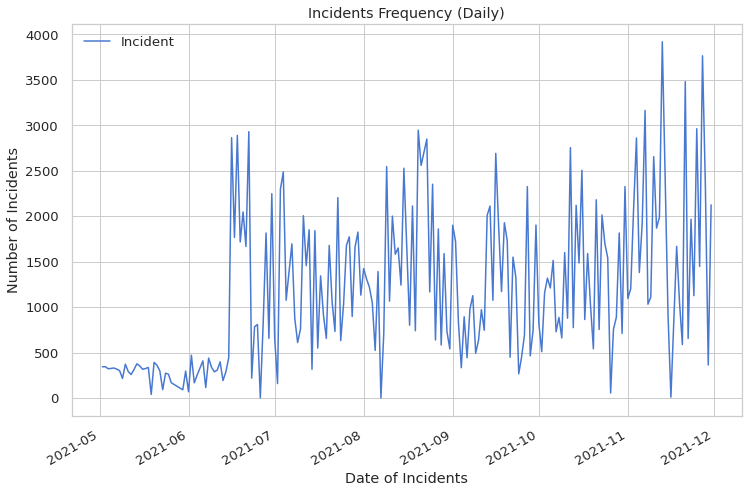

In [ ]:
pulse_point_df.groupby(['date_of_incident']).count()['title'].reset_index().rename(columns={'date_of_incident':'Date',
                                                    'title':'count'}).sort_values('Date').plot(y='count',
                                                             x='Date',label="Incident")
plt.xlabel('Date of Incidents')
plt.ylabel('Number of Incidents')
plt.title("Incidents Frequency (Daily)")
plt.show();

**Number of PulsePoint dispatches increased after August, 2021**

#### Weekly

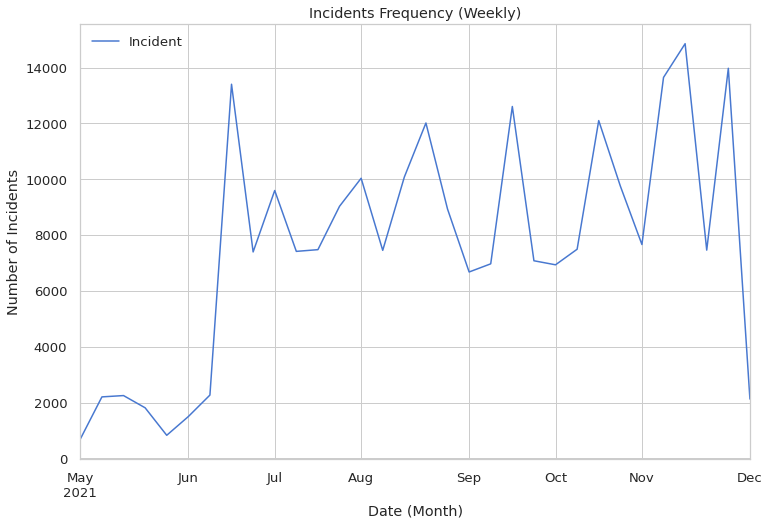

In [ ]:
pulse_point_df.groupby([pd.Grouper(key='date_of_incident', 
                                   freq='W-MON')]).count()['title'].reset_index().rename(columns={'date_of_incident':'Date',
                                                    'title':'count'}).sort_values('Date').plot(y='count',
                                                             x='Date',label="Incident")
plt.xlabel('Date (Month)')
plt.ylabel('Number of Incidents')
plt.title("Incidents Frequency (Weekly)")
plt.show();

### Weekday Time

In [ ]:
# pulse_point_df.groupby(['day_name','time_of_the_day'],as_index=False).count()

incident_time_df = pulse_point_df.groupby(["day_name", "time_of_the_day"],
                                     as_index=False).count()[['day_name', 
                                                              'time_of_the_day',
                                     'title']].reset_index(drop=True).rename(columns={'date_of_incident':'date',
                                                                                               'title':'incident_count'})
incident_time_df

,day_name,time_of_the_day,incident_count
0,Friday,Afternoon,3591
1,Friday,Evening,2723
2,Friday,Midnight,10424
3,Friday,Morning,13059
4,Friday,Night,4024
5,Monday,Afternoon,3640
6,Monday,Evening,3667
7,Monday,Midnight,9165
8,Monday,Morning,12320
9,Monday,Night,4960


,day_name,incident_count
3,Sunday,40556
4,Thursday,36768
6,Wednesday,34315
0,Friday,33821
1,Monday,33752
2,Saturday,33200
5,Tuesday,31361


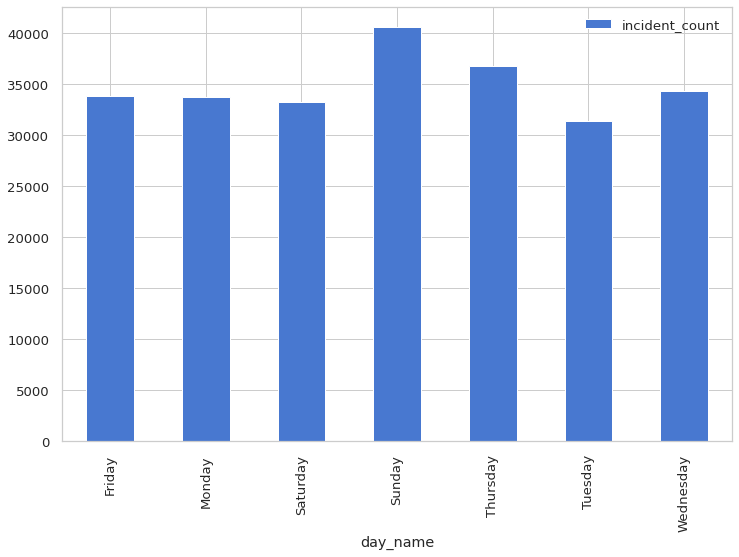

In [ ]:
display(incident_time_df.groupby(['day_name']).sum().reset_index().sort_values(["incident_count"], ascending=False))

display(incident_time_df.groupby(['day_name']).sum().plot(kind='bar'))

**Highest number of incidents occurred on Sunday**  

#### Time of the Day

In [ ]:
# incident_time_df.groupby(['day_name','time_of_the_day']).sum().plot(kind='bar', figsize=(25,8));

fig = px.bar(incident_time_df, 
        x="day_name", 
        y="incident_count", 
        color="time_of_the_day", 
        barmode="group",
        labels={'day_name':'Day', 
                'incident_count': 'Incident Count',
                'time_of_the_day': ''},
        title=f"Number of Incidents by Time of the Day",
        ).for_each_trace(lambda t: t.update(name=t.name.replace("=","")))

printmd("Emergency responses spiked at **midnight** or in the **morning**")
fig.show()


## alternative in seaborn catplot

# g=sns.catplot(data= incident_time_df, 
#               x="time_of_the_day", 
#               col='day_name',
#               y='incident_count', 
#               kind='bar', 
#               height=6,
#               col_wrap=4,
#                 )
# # bug : x-ticks not showing while using col_wrap
# # fixed : https://stackoverflow.com/a/52184614/11105356
# for ax in g.axes.flatten():
#     ax.tick_params(labelbottom=True)
# g.set_ylabels('Incident count')
# # for rotated x-ticks 
# # for ax in g.axes:
# #     plt.setp(ax.get_xticklabels(), visible=True, rotation=45)
# # plt.subplots_adjust(hspace=0.5)
# plt.show()

Emergency responses spiked at **midnight** or in the **morning**

**Most of the incidents occurred during Midnight or in the morning. Probably some of the incidents were already started at nighttime and were logged later in the morning.**

<a id='6.7'></a>
## 6.7 Major Incidents

In [ ]:
pulse_point_df.groupby(['title']).count()[['agency']].rename(columns={'agency':'total'}).sort_values('total', ascending=False)[:25]

,total
title,
Medical Emergency,154321
Traffic Collision,19754
Fire Alarm,9580
Alarm,6571
Public Service,6244
Refuse/Garbage Fire,4233
Structure Fire,3900
Mutual Aid,2728
Lift Assist,2700


In [ ]:
mask = (pulse_point_df.time_of_the_day == 'Midnight') | (pulse_point_df.time_of_the_day == 'Morning') 
highest_occ_incident = pulse_point_df[mask].groupby(['time_of_the_day','title']).count()[['agency']].rename(columns={'agency':'total'})

highest_occ_incident.sort_values('total', ascending=False)[:25]

total
time_of_the_day title                            
Morning         Medical Emergency           55296
Midnight        Medical Emergency           41632
Morning         Traffic Collision            7004
Midnight        Traffic Collision            6347
Morning         Fire Alarm                   2983
Midnight        Fire Alarm                   2679
Morning         Public Service               2341
                Alarm                        2111
Midnight        Alarm                        1868
                Public Service               1717
Morning         Refuse/Garbage Fire          1588
                Structure Fire               1466
                Fire                         1047
Midnight        Structure Fire               1007
Morning         Residential Fire              951
                Mutual Aid                    921
                Lift Assist                   874
Midnight        Refuse/Garbage Fire           831
Morning         Outside Fire                  822
Midnight        Mutual Aid                    732
Morning         Expanded Traffic Collision    710
Midnight        Residential Fire              658
                Expanded Traffic Collision    648
Morning         Investigation                 629
Midnight        Lift Assist                   627

Top ten emergencies during 'Midnight' or 'Morning' -

Midnight :

* Medical Emergency
* Traffic Collision
* Fire Alarm
* Alarm
* Public Service
* Structure Fire
* Refuse/Garbage Fire	
* Mutual Aid
* Residential Fire
* Expanded Traffic Collision

Morning :

* Medical Emergency
* Traffic Collision
* Fire Alarm
* Public Service
* Refuse/Garbage Fire
* Structure Fire
* Fire
* Residential Fire
* Mutual Aid
* Lift Assist



<a id='7'></a>
# 7 Clustering

<a id='7.1'></a>
## 7.1 Preprocess Dataset

In [ ]:
pulse_point_df.isna().sum()

title                       0
agency                      0
location                    0
timestamp_time              0
date_of_incident            0
description             12015
duration                    0
business               230406
address                     0
address_2              235940
city                        0
state                       0
duration_in_seconds         0
day_name                    0
weekday                     0
month_name                  0
time_of_the_day             0
dtype: int64

### Filter Data

- "timestamp_time" was replaced with "time_of_the_day" feature
- "date_of_incident" was replaced with "week_day", "day_name" and "month_name"
- "business" and "address_2" has lots of null values, hence those features were removed
- "duration" was converted to numerical value and replaced with "duration_in_seconds"

In [ ]:
pulse_point_cluster_df = pulse_point_df.drop([# 'location',
                                              'timestamp_time',
                                              'date_of_incident',
                                              # 'description',
                                              'duration',
                                              # 'address',
                                              'business', 
                                              'address_2', 
                                              ], axis=1)
pulse_point_cluster_df.dropna(inplace=True)
pulse_point_cluster_df.isna().sum()

title                  0
agency                 0
location               0
description            0
address                0
city                   0
state                  0
duration_in_seconds    0
day_name               0
weekday                0
month_name             0
time_of_the_day        0
dtype: int64

### Scaling

In [ ]:
def scaling_df(df):
  X_cluster = df.copy()
  object_cols = df.columns[df.dtypes == object].to_list()
  label_enc=LabelEncoder()
  for i in object_cols:
      X_cluster[i]=X_cluster[[i]].apply(label_enc.fit_transform)
  
  scaler = MinMaxScaler()
  scaler.fit(X_cluster)
  X_cluster_scaled = pd.DataFrame(scaler.transform(X_cluster),columns= X_cluster.columns)
  return X_cluster_scaled

In [ ]:
X_cluster = pulse_point_cluster_df.copy()
X_cluster_scaled = scaling_df(X_cluster)
X_cluster_scaled

,title,agency,location,description,address,city,state,duration_in_seconds,day_name,weekday,month_name,time_of_the_day
0,0.52381,0.589474,0.546968,0.480733,0.576408,0.411451,0.116279,0.009764,0.666667,0.5,1.0,0.5
1,0.52381,0.593421,0.647902,0.471624,0.671105,0.020172,0.116279,0.017986,0.666667,0.5,1.0,0.5
2,0.52381,0.603947,0.482910,0.638115,0.515799,0.630080,0.116279,0.056526,0.666667,0.5,1.0,0.5
3,0.52381,0.596053,0.919455,0.483730,0.926387,0.112430,0.116279,0.014388,0.666667,0.5,1.0,0.5
4,0.52381,0.594737,0.837316,0.486076,0.846814,0.775438,0.116279,0.019527,0.666667,0.5,1.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...
231753,0.52381,0.605263,0.456645,0.864472,0.490846,0.634233,0.372093,0.030832,0.666667,0.5,1.0,0.5
231754,0.52381,0.605263,0.526678,0.729570,0.556668,0.634233,0.372093,0.024666,0.666667,0.5,1.0,0.5
231755,0.52381,0.589474,0.386750,0.466919,0.425410,0.411451,0.116279,0.004111,0.666667,0.5,1.0,0.5
231756,0.52381,0.603947,0.704707,0.417999,0.723952,0.630080,0.116279,0.012333,0.666667,0.5,1.0,0.5


### PCA

In [ ]:
def pulse_point_pca(X_data, n_components):
  pca = PCA(n_components=n_components)

  fit_pca = pca.fit(X_data)
 
  print("Variance Explained with {0} components ".format(n_components),
        round(sum(fit_pca.explained_variance_ratio_),2))

  return fit_pca, fit_pca.transform(X_data)

In [ ]:
# for 12 components
pca_full, pulsepoint_data_full = pulse_point_pca(X_cluster_scaled, X_cluster_scaled.shape[1])

Variance Explained with 12 components  1.0


In [ ]:
X_cluster_scaled.shape

(231758, 12)

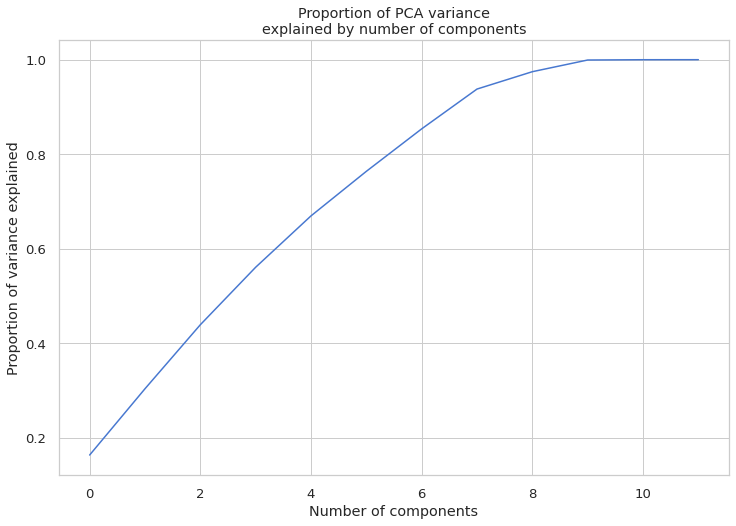

In [ ]:
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.title("Proportion of PCA variance\nexplained by number of components")
plt.xlabel("Number of components")
plt.ylabel("Proportion of variance explained");

We need about 7 components to explain ~90% of the variance in the data

<a id='7.2'></a>
## 7.2 Agency Engagement Vs Incident Duration by City

In [ ]:
pulse_point_state_duration_df = pulse_point_cluster_df.groupby('city').agg({'agency':'count', 'duration_in_seconds': 'sum'}).reset_index()
pulse_point_state_duration_df.duration_in_seconds = pulse_point_state_duration_df.duration_in_seconds.apply(lambda x: x/3600)

pulse_point_state_duration_df.columns= ['city','total_agency_engagement', 'total_duration_hr']

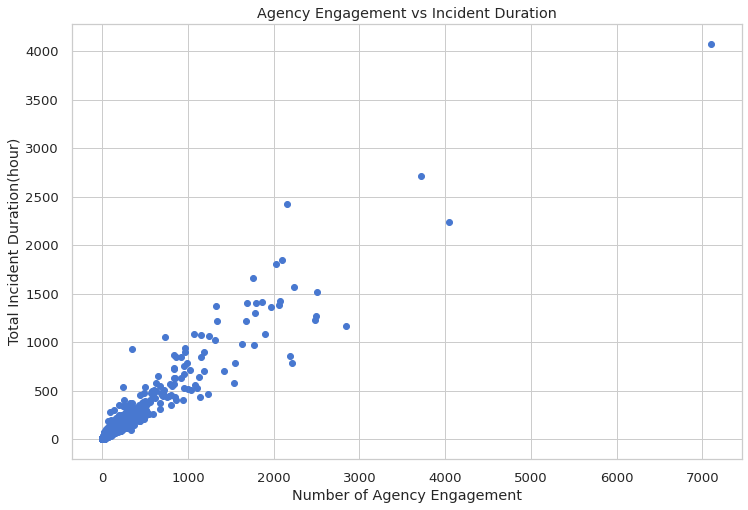

In [ ]:
x = pulse_point_state_duration_df['total_agency_engagement'].values
y = pulse_point_state_duration_df['total_duration_hr'].values
plt.scatter(x,y)
plt.title('Agency Engagement vs Incident Duration')
plt.xlabel('Number of Agency Engagement')
plt.ylabel('Total Incident Duration(hour)')
plt.show()

The `agency_count` (number of agency engagement) and `duration_hr` (duration in hour) has a positive linear relationship.

**Higher Duration of Incidents indicates more agency engagement in a city**

### Clustering States By Duration


In [ ]:
X = pulse_point_state_duration_df[['total_agency_engagement', 'total_duration_hr']].values

#### K-means Clustering

With “kmeans++” initialization the objective of this clustering is to create groups based on number of agency engagements and total incident duration (hour)

In [ ]:
# To decide the optimum cluster number, KMeans++ using Elbow method
# to figure out K for KMeans, I will use ELBOW Method on KMEANS++ Calculation

wcss=[]

for i in range(1,11):
    kmeans = KMeans(n_clusters= i, init='k-means++', random_state=SEED)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

    # inertia_ is the formula used to segregate the data points into clusters

**The best number of K lies between 2 and 4**

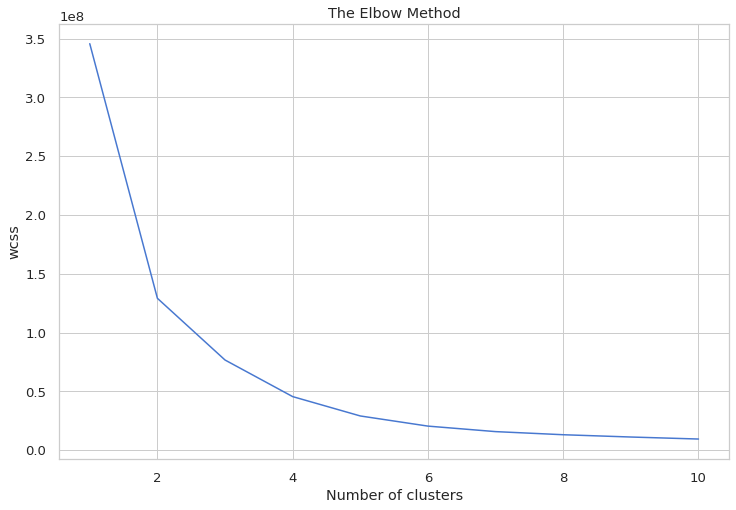

In [ ]:
plt.plot(range(1,11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters= 3, init='k-means++', random_state=SEED)
y_kmeans= kmeans.fit_predict(X)

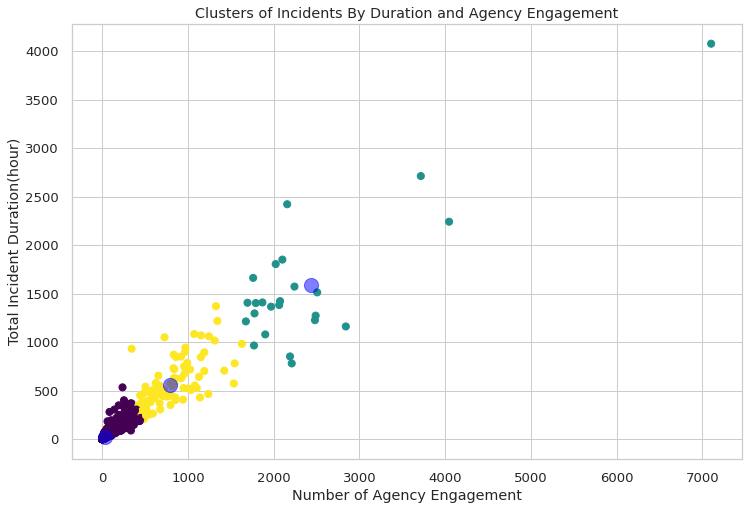

In [ ]:
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='blue', s=200, alpha=0.5);

plt.title('Clusters of Incidents By Duration and Agency Engagement')
plt.xlabel('Number of Agency Engagement')
plt.ylabel('Total Incident Duration(hour)')
plt.show()



> The k-mean clustering algorithm clusters the **cities** based on *duration of incidents* and *number of agencies* into **three groups**. Small duration indicates having less number of agency engagement and vice-versa.

> **Group 1** : Cities with very low number of incidents duraion and agency engagements

> **Group 2** : Cities with comparatively higher number of incidents duraion and agency engagements

> **Group 2** : Cities with highest number of incidents duraion and agency engagements



#### Agglomerative Clustering

With “KElbowVisualizer” from yellowbrick library it’s found that optimum K value is 4 ( it implements the “elbow” method)

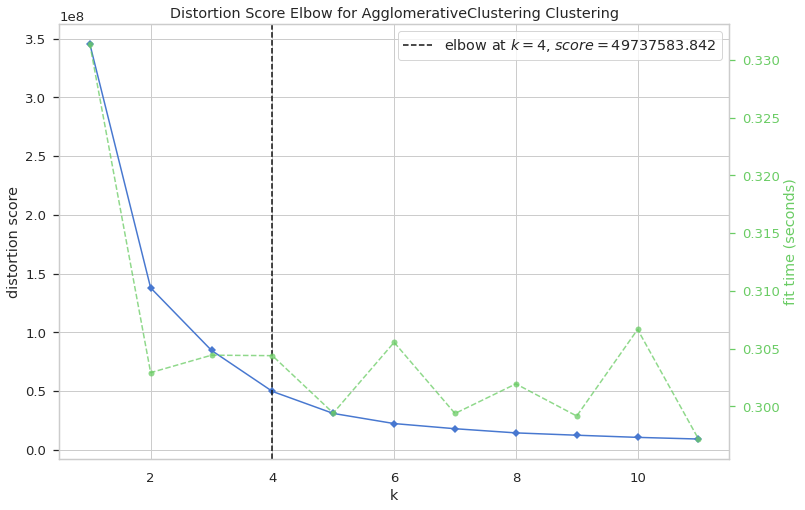

In [ ]:
# Instantiate the clustering model and visualizer
model = AgglomerativeClustering()
visualizer = KElbowVisualizer(model, k=(1,12))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show();

##### Ward Linkage

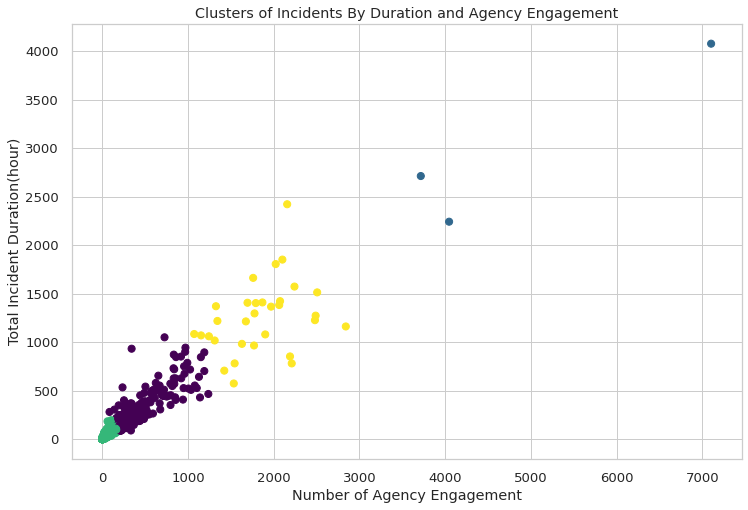

In [ ]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=4)
yhat_AC = AC.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=yhat_AC, s=50, cmap='viridis')
plt.title('Clusters of Incidents By Duration and Agency Engagement')
plt.xlabel('Number of Agency Engagement')
plt.ylabel('Total Incident Duration(hour)')
plt.show()

##### Complete Linkage

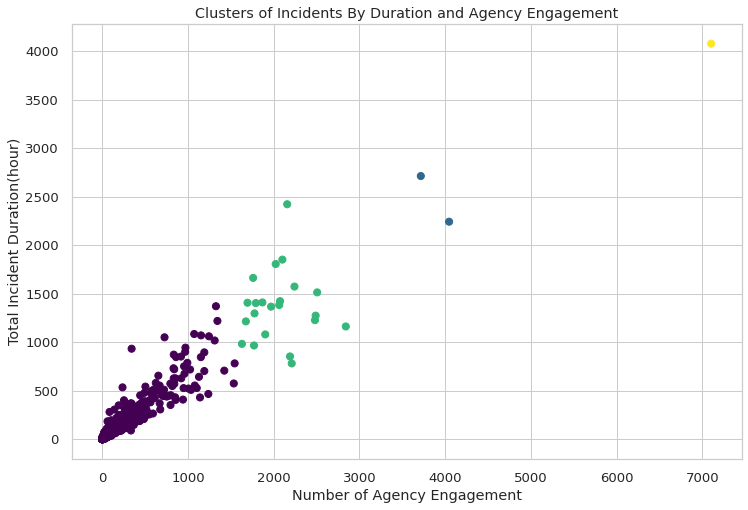

In [ ]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=4, linkage='complete')
yhat_AC = AC.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=yhat_AC, s=50, cmap='viridis')
plt.title('Clusters of Incidents By Duration and Agency Engagement')
plt.xlabel('Number of Agency Engagement')
plt.ylabel('Total Incident Duration(hour)')
plt.show()

#### Results
From the above clustering techniques, it is clear that “complete” linkage is not suitable for Agglomerative clustering (cluster parameter was given 4 but it mostly formed 2 clusters). On the other hand, k-means and “Ward” Agglomerative provided a better clustering result. But the density of the cities is high when the value of number of agency engagement and total incident duration is low. 

K-means++ focused on clustering lower dense cities with unequal parameter distribution –

* Cluster 0: Total incident duration = ~400, number of engagements = ~500
*	Cluster 1: Total incident duration = 400 to ~1200, number of engagements = 500 to ~1500
*	Cluster 2: Total incident duration = 1200 to max, number of engagements = 1500 to max

The range of cluster 1 is bigger than cluster 0 in k-means whereas Ward Agglomerative did almost an equally distributed clustering for cluster 0 and 1. If the range of the parameters (engagements of duration) is important based on other factor, for example – budget allocation with respect to engagements or business decision/future planning based on duration of emergencies, then depending on the priority both clusters would be acceptable. 


<a id='8'></a>
# 8 Key Insights

* Most of the incidents occurred in California
* Most incidents happened during midnight and in the morning throughout the week
* Most of the emergency engagement lasted under 30 mins
* The highest number of incidents happened on Sunday
* The incidents’ number got increased after Covid-19 lockdown
* Medical emergency was the highest occurring incident which was followed by traffic collision and fire alarm
* Montgomery County, Milwaukee Fire, and Columbus Fire were the top active agencies during the five monthly period


<a id='9'></a>
# 9 Top 10 Incidents

In [ ]:
top_incidents_list = pulse_point_df.title.value_counts().head(25).reset_index().rename(columns={'title':'total','index':'title'})
top_incidents_list

,title,total
0,Medical Emergency,154321
1,Traffic Collision,19754
2,Fire Alarm,9580
3,Alarm,6571
4,Public Service,6244
5,Refuse/Garbage Fire,4233
6,Structure Fire,3900
7,Mutual Aid,2728
8,Lift Assist,2700
9,Fire,2587


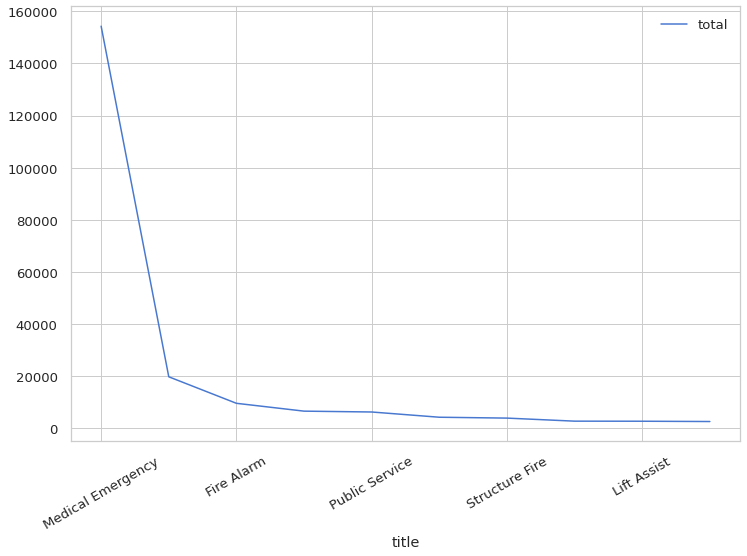

In [ ]:
top_incidents_list[:10].plot(x='title', y='total', rot=30);

In [ ]:
top_10_incidents = top_incidents_list.title.tolist()[:10]
top_10_incidents

['Medical Emergency',
 'Traffic Collision',
 'Fire Alarm',
 'Alarm',
 'Public Service',
 'Refuse/Garbage Fire',
 'Structure Fire',
 'Mutual Aid',
 'Lift Assist',
 'Fire']

In [ ]:
pulse_point_top_10_df = pulse_point_df[pulse_point_df['title'].isin(top_10_incidents)].reset_index(drop=True)
pulse_point_top_10_df

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state,duration_in_seconds,day_name,weekday,month_name,time_of_the_day
0,Medical Emergency,OCFA (Div 2),"EXECUTIVE PK, IRVINE, CA",3:05 AM,2021-09-16,CAR8799 E28,19 m,None,EXECUTIVE PK,NaN,IRVINE,CA,1140,Thursday,3,September,Midnight
1,Medical Emergency,OCFA (Div 5),"LOS ADORNOS, ALISO VIEJO, CA",3:05 AM,2021-09-16,CAR7199 E222,35 m,None,LOS ADORNOS,NaN,ALISO VIEJO,CA,2100,Thursday,3,September,Midnight
2,Medical Emergency,Oceanside FD,"DIXON RD, OCEANSIDE, CA",3:00 AM,2021-09-16,E216 RA216,1 h 50 m,None,DIXON RD,NaN,OCEANSIDE,CA,6600,Thursday,3,September,Midnight
3,Medical Emergency,OCFA (Div 7),"TULARE ST, BUENA PARK, CA",3:00 AM,2021-09-16,CAR9361 E61,28 m,None,TULARE ST,NaN,BUENA PARK,CA,1680,Thursday,3,September,Midnight
4,Medical Emergency,OCFA (Div 6),"S NEWHOPE ST, SANTA ANA, CA",2:59 AM,2021-09-16,CAR9578 E78,38 m,None,S NEWHOPE ST,NaN,SANTA ANA,CA,2280,Thursday,3,September,Midnight
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212613,Medical Emergency,Olathe Fire,"COLLEGE BLVD, OLATHE, KS",3:18 AM,2021-09-16,M1137 Q56,1 h 0 m,None,COLLEGE BLVD,NaN,OLATHE,KS,3600,Thursday,3,September,Midnight
212614,Medical Emergency,Olathe Fire,"E SANTA FE ST, OLATHE, KS",3:18 AM,2021-09-16,E54 M1152,48 m,None,E SANTA FE ST,NaN,OLATHE,KS,2880,Thursday,3,September,Midnight
212615,Medical Emergency,OCFA (Div 2),"ANTEATER DR & BONITA CANYON DR, IRVINE, CA",3:18 AM,2021-09-16,CAR6499 E4,8 m,None,ANTEATER DR & BONITA CANYON DR,NaN,IRVINE,CA,480,Thursday,3,September,Midnight
212616,Medical Emergency,Oceanside FD,"N HORNE ST, OCEANSIDE, CA",3:16 AM,2021-09-16,BLS217 E211,24 m,None,N HORNE ST,NaN,OCEANSIDE,CA,1440,Thursday,3,September,Midnight


### Group By Day & Time

In [ ]:
top_10_time_df = pulse_point_top_10_df.groupby(["title","day_name", "time_of_the_day"],
                                     as_index=False).count()[['title','day_name', 
                                                              'time_of_the_day',
                                     'agency']].reset_index(drop=True).rename(columns={'date_of_incident':'date',
                                                                                             'agency':'incident_count'})
top_10_time_df

,title,day_name,time_of_the_day,incident_count
0,Alarm,Friday,Afternoon,93
1,Alarm,Friday,Evening,92
2,Alarm,Friday,Midnight,314
3,Alarm,Friday,Morning,331
4,Alarm,Friday,Night,121
...,...,...,...,...
345,Traffic Collision,Wednesday,Afternoon,199
346,Traffic Collision,Wednesday,Evening,322
347,Traffic Collision,Wednesday,Midnight,791
348,Traffic Collision,Wednesday,Morning,856


### Utility Plot Function

In [ ]:
# plotly categorical barplot
def plot_top_incident_by_time(title):
  fig = px.bar(top_10_time_df[top_10_time_df.title.str.strip()==title], 
        x="day_name", 
        y="incident_count", 
        color="time_of_the_day", 
        barmode="group",
        labels={'day_name':'Day', 
                'incident_count': 'Incident Count',
                'time_of_the_day': ''},
        title=f"{title} by Time of The Day",
        ).for_each_trace(lambda t: t.update(name=t.name.replace("=","")))
  # remove '=' sign from color
  # https://github.com/plotly/plotly_express/issues/36
  fig.show()


# seaborn alternative

# def plot_top_incident_by_time(title):
#   g=sns.catplot(data=top_10_time_df[top_10_time_df.title.str.strip()==title], 
#                 x="time_of_the_day",
#                 y='incident_count', 
#                 col='day_name',
#                 kind='bar', 
#                 height=6,
#                 col_wrap=4,)

#   for ax in g.axes.flatten():
#       ax.tick_params(labelbottom=True)

#   g.set_ylabels('Incident count')
#   g.set_axis_labels('Time of the Day')
#   g.set_titles("{col_name}")
#   # g.despine(left=True)
#   # plt.suptitle('Incident By Time')
#   plt.show()

## Medical Emergency

In [ ]:
plot_top_incident_by_time('Medical Emergency')

## Traffic Collision

In [ ]:
plot_top_incident_by_time('Traffic Collision')

## Fire Alarm

In [ ]:
plot_top_incident_by_time('Fire Alarm')

## Alarm

In [ ]:
plot_top_incident_by_time('Alarm')

## Public Service

In [ ]:
plot_top_incident_by_time('Public Service')

## Refuse/Garbage Fire

In [ ]:
plot_top_incident_by_time('Refuse/Garbage Fire')

## Structure Fire

In [ ]:
plot_top_incident_by_time('Structure Fire')

## Mutual Aid

In [ ]:
plot_top_incident_by_time('Mutual Aid')

## Lift Assist

In [ ]:
plot_top_incident_by_time('Lift Assist')

## Fire

In [ ]:
plot_top_incident_by_time('Fire')

<a id='10'></a>
# 10 Top State : CA 

According to a 2017 study from the U.S. Census Bureau, California state's local governments consist of 57 counties, 482 cities, towns, and villages, and 2,894 special districts

In [ ]:
pulse_point_ca_df = pulse_point_df[pulse_point_df.state.str.strip() == 'CA'].copy()
pulse_point_ca_df.drop(axis=1, columns=['state'],inplace=True)
pulse_point_ca_df.head()

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,duration_in_seconds,day_name,weekday,month_name,time_of_the_day
0,Medical Emergency,OCFA (Div 2),"EXECUTIVE PK, IRVINE, CA",3:05 AM,2021-09-16,CAR8799 E28,19 m,None,EXECUTIVE PK,NaN,IRVINE,1140,Thursday,3,September,Midnight
1,Medical Emergency,OCFA (Div 5),"LOS ADORNOS, ALISO VIEJO, CA",3:05 AM,2021-09-16,CAR7199 E222,35 m,None,LOS ADORNOS,NaN,ALISO VIEJO,2100,Thursday,3,September,Midnight
2,Medical Emergency,Oceanside FD,"DIXON RD, OCEANSIDE, CA",3:00 AM,2021-09-16,E216 RA216,1 h 50 m,None,DIXON RD,NaN,OCEANSIDE,6600,Thursday,3,September,Midnight
3,Medical Emergency,OCFA (Div 7),"TULARE ST, BUENA PARK, CA",3:00 AM,2021-09-16,CAR9361 E61,28 m,None,TULARE ST,NaN,BUENA PARK,1680,Thursday,3,September,Midnight
4,Medical Emergency,OCFA (Div 6),"S NEWHOPE ST, SANTA ANA, CA",2:59 AM,2021-09-16,CAR9578 E78,38 m,None,S NEWHOPE ST,NaN,SANTA ANA,2280,Thursday,3,September,Midnight


<a id='10.1'></a>
## 10.1 Descriptive Analysis

In [ ]:
pulse_point_ca_df.describe().T

,count,mean,std,min,25%,50%,75%,max
duration_in_seconds,70989.0,2221.934666,2417.598147,0.0,960.0,1500.0,2940.0,94080.0
weekday,70989.0,3.210821,2.077433,0.0,1.0,3.0,5.0,6.0


**The average duration of the incidents is ~37 minutes**

In [ ]:
pulse_point_ca_df.describe(include='object').T

,count,unique,top,freq
title,70989,81,Medical Emergency,43022
agency,70989,188,Contra Costa FPD,4145
location,70989,47138,"N HARBOR BL, FULLERTON, CA",72
timestamp_time,70989,1440,4:50 AM,94
description,69491,20218,E51,377
duration,70989,430,19 m,2074
business,2784,2279,UNINC,76
address,70989,43656,EL CAMINO REAL,93
address_2,2310,1068,GIL,147
city,70989,748,LOS ANGELES,7449


#### CA State Summary

1. **Contra Costa FPD** is the most engaged agency
2. Highest reported incidents occurred on Sunday
3. After the end of covid-19 lockdown, the number of emergency incidents was higher and peaked at last month - November
4. Most reported emergencies have taken place in Los Angeles
5. Fire Truck Engine 51 (E51) was the most frequent emergency code 

In [ ]:
pulse_point_ca_df.description.value_counts().head(20)

E51        377
E57        308
E53        268
E58        240
E3         230
E56        228
E52        223
E55        222
FA1 FE1    212
E1         210
E13        202
E11        197
E10        192
E60        188
E14        187
E54        187
E33        183
E2         181
E4         180
E18        173
Name: description, dtype: int64

Top emergency code descriptions refer to **Fire Emergency** -

* [E51 Fire Engine](https://en.wikipedia.org/wiki/Engine_51)
* [E57 responding to a emergency](https://youtu.be/KHLXfla934E)
* Here is an E53 Fire Truck - 
![E53 Fire Truck](https://live.staticflickr.com/684/32220280980_a36919d676_b.jpg "Credit: flickr")

In [ ]:
printmd(f"There are total **{len(pulse_point_ca_df.city.unique())}** cities in California")

There are total **748** cities in California

In [ ]:
pulse_point_ca_df.day_name.value_counts().head(10)
printmd(f"**Most emergencies take place in Saturday and Sunday (Holiday) in California**")

**Most emergencies take place in Saturday and Sunday (Holiday) in California**

### Incidents by Time of The Day

In [ ]:
pulse_point_ca_df.time_of_the_day.value_counts()

Morning      26537
Midnight     19147
Night         9643
Afternoon     9279
Evening       6383
Name: time_of_the_day, dtype: int64

### Major Incidents

In [ ]:
pulse_point_ca_df.title.value_counts().head(20)

Medical Emergency             43022
Traffic Collision              6008
Refuse/Garbage Fire            3260
Alarm                          2501
Fire Alarm                     1979
Public Service                 1699
Structure Fire                 1125
Fire                            995
Outside Fire                    728
Investigation                   679
Expanded Traffic Collision      670
Vehicle Fire                    560
Wires Down                      472
Commercial Fire                 466
Interfacility Transfer          413
Residential Fire                401
Vegetation Fire                 377
Lift Assist                     375
Emergency Response              363
Waterflow Alarm                 359
Name: title, dtype: int64

**Apart from medical emergency, top incidents of California includes fire, alarm and traffic collision** 

California is susceptible to an impressive array of natural hazards, including earthquakes, fires, flooding and mudslides.

Here is a good article on this - 

[4 REASONS CALIFORNIA IS MORE SUSCEPTIBLE TO NATURAL DISASTERS THAN OTHER STATES](https://www.snapnhd.com/blog/4-reasons-california-is-more-susceptible-to-natural-disasters-than-other-states)

### Major Cities

In [ ]:
pulse_point_ca_df.city.value_counts().head(20)

LOS ANGELES      7449
FREMONT          2280
LONG BEACH       1901
FULLERTON        1868
SANTA ANA        1564
COMPTON          1439
MILPITAS         1227
WOODLAND         1212
SANTA CLARITA    1082
ONTARIO          1044
LANCASTER        1043
IRVINE           1003
OCEANSIDE         979
POMONA            942
CONCORD           866
ANTIOCH           847
GARDEN GROVE      804
PALMDALE          798
GLENDALE          771
VICTORVILLE       703
Name: city, dtype: int64

**Map Geolocation**

In [ ]:
mask = (pulse_point_city_df.city.isin(pulse_point_ca_df.city.unique().tolist())) & (pulse_point_city_df.state == 'CA')

ca_city = pulse_point_city_df[mask].reset_index(drop=True)
ca_city

,city,state,count,location,longitude,latitude
0,**UNDEFINED,CA,17,"**UNDEFINED, CA, USA",-115.498284,32.678799
1,29 PALMS,CA,9,"29 PALMS, CA, USA",-116.054351,34.135692
2,ACTON,CA,33,"ACTON, CA, USA",-118.186838,34.480741
3,ADELANTO,CA,20,"ADELANTO, CA, USA",-117.409215,34.582770
4,AGOURA,CA,15,"AGOURA, CA, USA",-118.738129,34.143161
...,...,...,...,...,...,...
743,YOLO,CA,159,"YOLO, CA, USA",-121.905900,38.718454
744,YORBA LINDA,CA,281,"YORBA LINDA, CA, USA",-117.824971,33.890110
745,YUCCA VALLEY,CA,11,"YUCCA VALLEY, CA, USA",-116.413984,34.123621
746,ZAMORA,CA,58,"ZAMORA, CA, USA",-121.881912,38.796568


### Incidents Distribution 

In [ ]:
ca_city['count'].describe()

count     748.000000
mean       94.905080
std       344.691939
min         1.000000
25%         2.000000
50%         9.000000
75%        66.250000
max      7449.000000
Name: count, dtype: float64

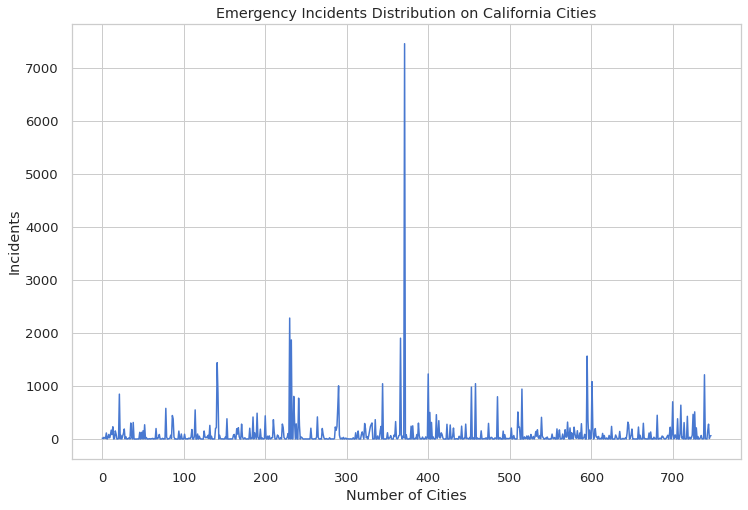

In [ ]:
ca_city['count'].plot(title='Emergency Incidents Distribution on California Cities');
plt.xlabel('Number of Cities')
plt.ylabel('Incidents')
plt.show()

<a id='10.2'></a>
## 10.2 Geoplot

### Color Code Cities (By Number of Inidents)

In [ ]:
ca_city['color']=ca_city['count'].apply(lambda count:"Black" if count>=1500 else
                                         "green" if count>=1200 and count<1500 else
                                         "Orange" if count>=800 and count<1200 else
                                         "darkblue" if count>=500 and count<800 else
                                         "red" if count>=300 and count<500 else
                                         "lightblue" if count>=100 and count<300 else
                                         "brown" if count>=10 and count<100 else
                                         "violet" if count>=5 and count<10 else
                                         "grey")
ca_city['size']=ca_city['count'].apply(lambda count:10 if count>=1500 else
                                         8 if count>=1200 and count<1500 else
                                         7 if count>=800 and count<1200 else
                                         6 if count>=500 and count<800 else
                                         5 if count>=300 and count<500 else
                                         4 if count>=100 and count<300 else
                                         3 if count>=10 and count<100 else
                                         2 if count>=5 and count<10 else
                                         1)

In [ ]:
geometry2 = geopandas.points_from_xy(ca_city.longitude, ca_city.latitude)
geo_df2 = geopandas.GeoDataFrame(ca_city[['city','count','longitude', 'latitude']], geometry=geometry2)

geo_df2.head()

,city,count,longitude,latitude,geometry
0,**UNDEFINED,17,-115.498284,32.678799,POINT (-115.49828 32.67880)
1,29 PALMS,9,-116.054351,34.135692,POINT (-116.05435 34.13569)
2,ACTON,33,-118.186838,34.480741,POINT (-118.18684 34.48074)
3,ADELANTO,20,-117.409215,34.582770,POINT (-117.40922 34.58277)
4,AGOURA,15,-118.738129,34.143161,POINT (-118.73813 34.14316)


In [ ]:
geoJSON_df = geopandas.read_file(state_geo)
geoJSON_CA = geoJSON_df.loc[geoJSON_df.id == 'CA']
geoJSON_CA

,id,name,geometry
4,CA,California,"POLYGON ((-123.23326 42.00619, -122.37885 42.01166, -121.03700 41.99523, -120.00186 41.99523, -119.99638 40.26452, -120.00186 38.99935, -118.71478 38.10113, -117.49890 37.21934, -116.54044 36.50186, -115.85034 35.97060, -114.63446 35.00118, -114.63446 34.87521, -114.47015 34.71090, -114.33323 34.44801, -114.13606 34.30561, -114.25655 34.17416, -114.41538 34.10844, -114.53587 33.93318, -114.49754 33.69767, -114.52492 33.54979, -114.72757 33.40739, -114.66184 33.03496, -114.52492 33.02948, -114.47015 32.84327, -114.52492 32.75563, -114.72209 32.71730, -116.04751 32.62419, -117.12647 32.53656, -117.24696 32.66800, -117.25244 32.87613, -117.32911 33.12259, -117.47151 33.29785, -117.78370 33.53884, -118.18352 33.76339, -118.26019 33.70314, -118.41355 33.74148, -118.39164 33.84007, -118.56690 34.04272, -118.80241 33.99890, -119.21866 34.14678, -119.27890 34.26727, -119.55823 34.41515, -119.87589 34.40967, -120.13878 34.47539, -120.47288 34.44801, -120.64814 34.57946, -120.60980 34.85878, -120.67005 34.90259, -120.63171 35.09976, -120.89460 35.24764, -120.90556 35.45029, -121.00414 35.46124, -121.16845 35.63650, -121.28347 35.67484, -121.33276 35.78438, -121.71614 36.19515, -121.89688 36.31565, -121.93522 36.63878, -121.85854 36.61140, -121.78734 36.80309, -121.92974 36.97836, -122.10501 36.95645, -122.33504 37.11528, -122.41719 37.24125, -122.40076 37.36174, -122.51578 37.52057, -122.51578 37.78346, -122.32956 37.78346, -122.40624 38.15042, -122.48839 38.11208, -122.50482 37.93134, -122.70199 37.89300, -122.93750 38.02993, -122.97584 38.26544, -123.12919 38.45165, -123.33184 38.56667, -123.44138 38.69811, -123.73713 38.95553, -123.68784 39.03221, -123.82476 39.36630, -123.76452 39.55252, -123.85215 39.83184, -124.10957 40.10569, -124.36151 40.25904, -124.41080 40.43978, -124.15886 40.87794, -124.10957 41.02581, -124.15886 41.14083, -124.06575 41.44206, -124.14790 41.71591, -124.25744 41.78163, -124.21363 42.00071, -123.23326 42.00619))"


In [ ]:
map_CA = folium.Map(location = [38, -115], zoom_start = 6)

# https://stackoverflow.com/a/61129097/11105356
folium.GeoJson(geoJSON_CA.geometry,
               name='California').add_to(map_CA)


for lat,lon,area,color,count,size in zip(ca_city['latitude'],ca_city['longitude'],ca_city['city'],ca_city['color'],ca_city['count'],ca_city['size']):
     folium.CircleMarker([lat, lon],
                            popup=folium.Popup(f"{area}, {count}", parse_html=True),
                            radius=size*5,
                            color='b',
                            fill=True,
                            fill_opacity=0.7,
                            fill_color=color,
                           ).add_to(map_CA)
map_CA

### With Heatmap

In [ ]:
heat_data = [[point.xy[1][0], point.xy[0][0]] for point in geo_df2.geometry ]

# # heat_data
HeatMap(heat_data).add_to(map_CA)

map_CA

### With Marker

In [ ]:
map_CA_c = folium.Map(location = [38, -115], zoom_start = 6)

# https://stackoverflow.com/a/61129097/11105356
folium.GeoJson(geoJSON_CA.geometry,
               name='California').add_to(map_CA_c)

for i in range(0, len(ca_city)):
  folium.Marker(
    location = [ca_city.iloc[i]['latitude'], ca_city.iloc[i]['longitude']],
    popup = folium.Popup(f"{ca_city.iloc[i]['city']}\n{ca_city.iloc[i]['count']}", parse_html=True),
    icon=folium.features.CustomIcon('https://i.postimg.cc/JhmnMQXj/sos.png', icon_size=(24, 31))
  ).add_to(map_CA_c)

# # heat_data
HeatMap(heat_data).add_to(map_CA_c)

map_CA_c

<a id='10.3'></a>
## 10.3 Insights

1. Southern and central California are two most active region
2. Most of the incidents have taken place in Los Angelos and San Francisco, both are highly active city (PulsePoint is based in the San Francisco Bay Area)

<a id='11'></a>
# 11 Conclusions

## Future Work

- Dataset still has some outliers in location related features. This issue will be resolved in the future version
- I performed clustering on incident duration and agency engagement grouped by cities. So, different groups of data could be explored for clustering as well as other clustering techniques 
- Better result could be achieved by performing dimensionality reduction for clustering or hyperparameter tuning
- Detailed time series & geospatial analysis on the dataset
- The impact of/correlations with the lockdown and other Covid-19-driven policy actions/agency activities in different states in 2020
- Detailed investigation on the possible correlation/inference with the incidents and local infrastructure


## End Notes

- **Demographic data** would be valuabe to do research on users to find more insights and their association with emergencies
- A glossary / clear explanation of all emegercy codes (description) would be valuable to sort out incidents
- Research work on PulsePoint can be found here - [https://www.pulsepoint.org/research-studies](https://www.pulsepoint.org/research-studies)


<a id='12'></a>
# 12 References

1. [PulsePoint Wikipedia](https://en.wikipedia.org/wiki/PulsePoint)
2. [Provinces and territories of Canada](https://en.wikipedia.org/wiki/Provinces_and_territories_of_Canada)
3. [Google Public Dataset-US states](https://developers.google.com/public-data/docs/canonical/states_csv)
4. [US States GeoJSON](https://github.com/python-visualization/folium/blob/main/examples/data/us-states.json)